# Evaluate models trained in other notebook:

## Setting up:
### Additional installations

In [ ]:
! pip install cartopy
! pip install pyproj
! pip install wandb
! pip install -U -q PyDrive
! pip uninstall shapely
! pip install shapely --no-binary shapely
! pip install bioinfokit
! pip install sewar

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 10.8 MB 4.3 MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... error
     |████████████████████████████████| 10.8 MB 31.2 MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... error
     |████████████████████████████████| 10.8 MB 20.7 MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... error
     |████████████████████████████████| 12.1 MB 16.0 MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done
     |████████████████████████████████| 14.4 MB 136 kB/s 
     |████████████████████████████████| 46 kB 4.0 MB/s 
  Created wheel for cartopy: filename=Cartopy-0.18.0-cp37-cp37m-linux_x86_64.whl size=15127777 sha256=aa4601b222b531443c382ce9c395806d7d1f25f2dcbf2087629b640e6

### Imports:

In [ ]:
# Basics
from matplotlib import pyplot as plt
import matplotlib.path as mpath
import os
import sys
from pathlib import Path
from os import listdir
from os.path import isfile, join
import numpy as np
import pandas as pd
from datetime import datetime
from datetime import timedelta
from tqdm import tqdm
from re import search
from math import cos,sin,pi
import random as rn
from google.colab import auth
from google.colab import files
import math

# xarray and cartopy plots
import xarray as xr

import cartopy
import cartopy.crs as ccrs
import pyproj
from pyproj import Transformer

# ML
from scipy import ndimage
import torch
import tensorflow as tf 
import torch.nn as nn
import torch.nn.functional as F
import argparse
import logging
import wandb
from torch import optim
from torch.utils.data import DataLoader, random_split
from torch.utils.data import Dataset
from torch.utils.data import TensorDataset
from torchvision import datasets
from torchvision.transforms import ToTensor

from sklearn.model_selection import train_test_split
#import setGPU

%matplotlib inline
%load_ext autoreload
%autoreload 2

### Set up CUDA:

In [ ]:
print(f"Is CUDA supported by this system? {torch.cuda.is_available()}")
print(f"CUDA version: {torch.version.cuda}")
  
# Storing ID of current CUDA device
if torch.cuda.is_available():
  cuda_id = torch.cuda.current_device()
  print(f"ID of current CUDA device:{torch.cuda.current_device()}")
          
  print(f"Name of current CUDA device:{torch.cuda.get_device_name(cuda_id)}")

  device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

Is CUDA supported by this system? False
CUDA version: 11.3


### Helper scripts:

In [ ]:
# Load configuration file:
from config import *
from dataFunctions import *
from makeInputs import *
from metrics import *
# Import custom scripts
#sys.path.append('../')
#from GC_scripts import * # Google cloud scripts

%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [ ]:
# difference between both
def Diff(li1, li2):
  return list(set(li1) - set(li2)) + list(set(li2) - set(li1))

### Set up Google Cloud:

In [ ]:
"""
auth.authenticate_user()
# Give our project ID
project_id = 'ee-iceshelf-gee4geo'
!gcloud config set project {project_id}
# Download the file from a given Google Cloud Storage bucket.
!gsutil cp gs://ee-downscalingclimatemodels/test.txt /tmp/gsutil_download.txt
# Print the result to make sure the transfer worked.
!cat /tmp/gsutil_download.txt"""

"\nauth.authenticate_user()\n# Give our project ID\nproject_id = 'ee-iceshelf-gee4geo'\n!gcloud config set project {project_id}\n# Download the file from a given Google Cloud Storage bucket.\n!gsutil cp gs://ee-downscalingclimatemodels/test.txt /tmp/gsutil_download.txt\n# Print the result to make sure the transfer worked.\n!cat /tmp/gsutil_download.txt"

### Set up Google Drive:

In [ ]:
# Code to read csv file into Colaboratory:
from pydrive.auth import GoogleAuth
from pydrive.drive import GoogleDrive
from google.colab import auth
from oauth2client.client import GoogleCredentials
# Authenticate and create the PyDrive client.
auth.authenticate_user()
gauth = GoogleAuth()
gauth.credentials = GoogleCredentials.get_application_default()
Googledrive = GoogleDrive(gauth)

### Fonts and police size:

In [ ]:
plt.style.use('seaborn-white')

SMALL_SIZE = 12
MEDIUM_SIZE = 14
BIGGER_SIZE = 16

plt.rcParams['lines.linewidth'] = 1.5

plt.rc('font', size=MEDIUM_SIZE)          # controls default text sizes
plt.rc('axes', titlesize=BIGGER_SIZE)     # fontsize of the axes title
plt.rc('axes', labelsize=MEDIUM_SIZE)    # fontsize of the x and y labels
plt.rc('xtick', labelsize=MEDIUM_SIZE)    # fontsize of the tick labels
plt.rc('ytick', labelsize=MEDIUM_SIZE)    # fontsize of the tick labels
plt.rc('legend', fontsize=MEDIUM_SIZE)    # legend fontsize
plt.rc('figure', titlesize=BIGGER_SIZE)  # fontsize of the figure title

## Load data:

### (Input eval 1) Global climate model (GCM Like):

In [ ]:
%%time
if DOWNLOAD_FROM_GC:
    downloadFileFromGC(pathGC, "", fileGCMLike)
    GCMLike = xr.open_dataset(fileGCMLike)
    os.remove(fileGCMLike)
else:
    idGCMLike = '1ab88hzzd5D9RIDsI6LdGAKO6DFo_R3L2'
    downloaded = Googledrive.CreateFile({'id':idGCMLike}) 
    downloaded.GetContentFile(fileGCMLike)  
    GCMLike = xr.open_dataset(fileGCMLike)
    os.remove(fileGCMLike)

CPU times: user 3.36 s, sys: 812 ms, total: 4.17 s
Wall time: 17.4 s


In [ ]:
GCMLike

<xarray.Dataset>
Dimensions:      (x: 90, y: 25, time: 1452)
Coordinates:
    spatial_ref  int64 ...
  * x            (x) float32 -2.992e+06 -2.924e+06 ... 2.992e+06 3.06e+06
  * y            (y) float32 -2.472e+06 -2.266e+06 ... 2.266e+06 2.472e+06
  * time         (time) datetime64[ns] 1980-01-31 1980-02-29 ... 2100-12-31
Data variables:
    SF           (time, y, x) float32 ...
    RF           (time, y, x) float32 ...
    SP           (time, y, x) float32 ...
    LWD          (time, y, x) float32 ...
    SWD          (time, y, x) float32 ...
    TT           (time, y, x) float32 ...
    SMB          (time, y, x) float32 ...
    TTP          (time, y, x) float64 ...
    QQP          (time, y, x) float64 ...
    PR           (time, y, x) float32 ...
    NW           (time, y, x) float64 ...
    EW           (time, y, x) float64 ...
Attributes:
    crs:      3031

/usr/local/lib/python3.7/dist-packages/cartopy/crs.py:245: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  if len(multi_line_string) > 1:
/usr/local/lib/python3.7/dist-packages/cartopy/crs.py:297: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  for line in multi_line_string:
/usr/local/lib/python3.7/dist-packages/cartopy/crs.py:364: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  if len(p_mline) > 0:
/usr/local/lib/python3.7/dist-packages/cartopy/io/__init__.py:260: DownloadWarning: Downloading: https://naci

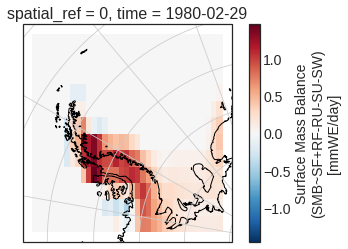

In [ ]:
ds = createLowerInput(GCMLike, region='Larsen', Nx=35, Ny=25, print_=False)
ds = ds.where(ds.y > 0, drop=True)
ax = plt.subplot(1,1,1, projection=ccrs.SouthPolarStereo() )
ds.SMB.isel(time = 1).plot(x='x', ax = ax, transform=ccrs.SouthPolarStereo())
ax.coastlines("10m", color="black")
ax.gridlines()

### (Input eval 2) Real GCM:

In [ ]:
%%time
if DOWNLOAD_FROM_GC:
    downloadFileFromGC(pathGC, "", fileGCM)
    GCMLike = xr.open_dataset(fileGCM)
    os.remove(fileGCM)
else:
    idGCM = '1Rq4tIPxNTPtTonaMe1gi6PxHmLwgy8D-'
    downloaded = Googledrive.CreateFile({'id':idGCM}) 
    downloaded.GetContentFile(fileGCM)  
    GCM = xr.open_dataset(fileGCM)
    os.remove(fileGCM)
GCM = GCM.rename_vars({'ps':'SP', 'uas':'EW', 'vas':'NW', 'pr':'PR', 
                       'tas': 'TT', 
                       'rsds':'SWD', 'rlds':'LWD', 'huss':'QQP', 'hurs':'RH'})
GCM['TT'].attrs["units"] = "C"
GCM  = GCM.drop(['RH'])

CPU times: user 2.14 s, sys: 312 ms, total: 2.45 s
Wall time: 10.5 s


In [ ]:
GCM

<xarray.Dataset>
Dimensions:      (time: 1452, x: 90, y: 25)
Coordinates:
    spatial_ref  int64 ...
  * time         (time) datetime64[ns] 1980-01-31 1980-02-29 ... 2100-12-31
  * x            (x) float32 -2.992e+06 -2.924e+06 ... 2.992e+06 3.06e+06
  * y            (y) float32 -2.472e+06 -2.266e+06 ... 2.266e+06 2.472e+06
Data variables:
    QQP          (time, y, x) float32 ...
    PR           (time, y, x) float64 ...
    TT           (time, y, x) float32 ...
    SP           (time, y, x) float32 ...
    SWD          (time, y, x) float32 ...
    LWD          (time, y, x) float32 ...
    NW           (time, y, x) float32 ...
    EW           (time, y, x) float32 ...
Attributes: (12/29)
    institution:            CSIRO (Commonwealth Scientific and Industrial Res...
    institute_id:           CSIRO-BOM
    experiment_id:          historical
    source:                 ACCESS1-3 2011. Atmosphere: AGCM v1.0 (N96 grid-p...
    model_id:               ACCESS1.3
    forcing:                GHG, Oz, SA, Sl, Vl, BC, OC, (GHG = CO2, N2O, CH4...
    ...                     ...
    title:                  ACCESS1-3 model output prepared for CMIP5 historical
    parent_experiment:      pre-industrial control
    modeling_realm:         atmos
    realization:            1
    cmor_version:           2.8.0
    crs:                    3031

/usr/local/lib/python3.7/dist-packages/cartopy/crs.py:245: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  if len(multi_line_string) > 1:
/usr/local/lib/python3.7/dist-packages/cartopy/crs.py:297: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  for line in multi_line_string:
/usr/local/lib/python3.7/dist-packages/cartopy/crs.py:364: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  if len(p_mline) > 0:


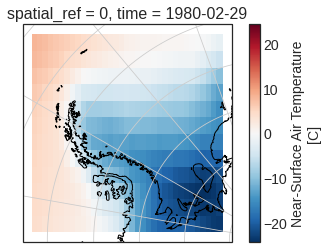

In [ ]:
ds = createLowerInput(GCM, region='Larsen', Nx=35, Ny=25, print_=False)
ds = ds.where(ds.y > 0, drop=True)
ax = plt.subplot(1,1,1, projection=ccrs.SouthPolarStereo() )
ds.TT.isel(time = 1).plot(x='x', ax = ax, transform=ccrs.SouthPolarStereo())
ax.coastlines("10m", color="black")
ax.gridlines()

#### Compare GCM and GCMLike variables:

In [ ]:
# Names of variables for plots:
GCMLike.EW.attrs['long_name'] = 'Eastward Wind'
GCMLike.NW.attrs['long_name'] = 'Northward Wind'
GCMLike.LWD.attrs['long_name'] = 'Long Wave Downward'

GCM.SWD.attrs['long_name'] = 'Short Wave Downward'
GCM.LWD.attrs['long_name'] = 'Long Wave Downward'
GCM.SP.attrs['long_name'] = 'Surface Pressure'
GCM.TT.attrs['long_name'] = 'Temperature'

/usr/local/lib/python3.7/dist-packages/cartopy/crs.py:245: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  if len(multi_line_string) > 1:
/usr/local/lib/python3.7/dist-packages/cartopy/crs.py:297: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  for line in multi_line_string:
/usr/local/lib/python3.7/dist-packages/cartopy/crs.py:364: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  if len(p_mline) > 0:
/usr/local/lib/python3.7/dist-packages/cartopy/crs.py:402: ShapelyDeprecationWarning: Iteration over multi-pa

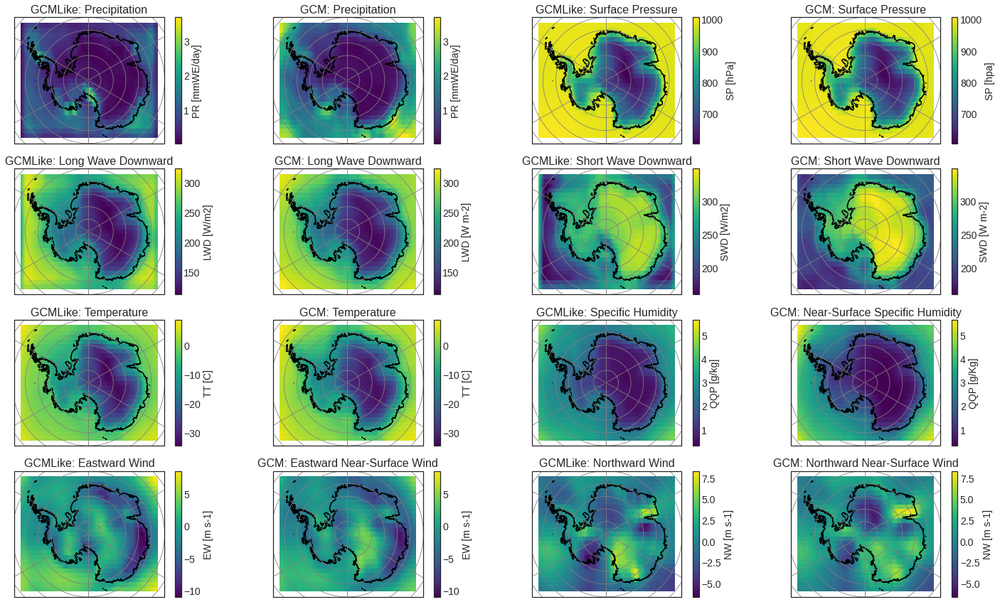

In [ ]:
vars =['PR', 'SP', 'LWD','SWD','TT', 'QQP', 'EW', 'NW' ]

plotAllVar2Xr(
    GCMLike.drop(['SMB']),  # xr.Dataset
    GCM,
    m = 4,
    n = 4,
    vars_ = vars,
    figsize = (25, 15)
)

### (Target) Regional climate model:

In [ ]:
%%time
if DOWNLOAD_FROM_GC:
    downloadFileFromGC(pathGC, "", fileTarget)
    target_dataset = xr.open_dataset(fileTarget)
    os.remove(fileTarget)
else:
    idTarget = '1r8mVOIo6GDTe6fHb9EZikZMdwPHurHSe'
    downloaded = Googledrive.CreateFile({'id':idTarget}) 
    downloaded.GetContentFile(fileTarget) 
    target_dataset = xr.open_dataset(fileTarget)
    os.remove(fileTarget)
print(target_dataset.dims)

# Cut a small part of on the right that is not too important
N = 160
max_x = (N / 2) * 35 * 1000
max_y = (N / 2) * 35 * 1000

target_dataset = cutBoundaries(target_dataset, max_x, max_y)
print("New target dimensions:", target_dataset.dims)

Frozen({'time': 1452, 'x': 176, 'y': 148})
New target dimensions: Frozen({'time': 1452, 'y': 148, 'x': 160})
CPU times: user 2.29 s, sys: 350 ms, total: 2.64 s
Wall time: 8.42 s


In [ ]:
target_dataset

<xarray.Dataset>
Dimensions:      (time: 1452, y: 148, x: 160)
Coordinates:
  * time         (time) datetime64[ns] 1980-01-31 1980-02-29 ... 2100-12-31
  * x            (x) float32 -2.8e+06 -2.765e+06 ... 2.73e+06 2.765e+06
  * y            (y) float32 -2.555e+06 -2.52e+06 ... 2.555e+06 2.59e+06
    spatial_ref  int64 0
Data variables:
    SMB          (time, y, x) float32 0.0 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0

## Plot input and target domains:

/usr/local/lib/python3.7/dist-packages/cartopy/crs.py:245: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  if len(multi_line_string) > 1:
/usr/local/lib/python3.7/dist-packages/cartopy/crs.py:297: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  for line in multi_line_string:
/usr/local/lib/python3.7/dist-packages/cartopy/crs.py:364: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  if len(p_mline) > 0:
/usr/local/lib/python3.7/dist-packages/cartopy/crs.py:402: ShapelyDeprecationWarning: Iteration over multi-pa

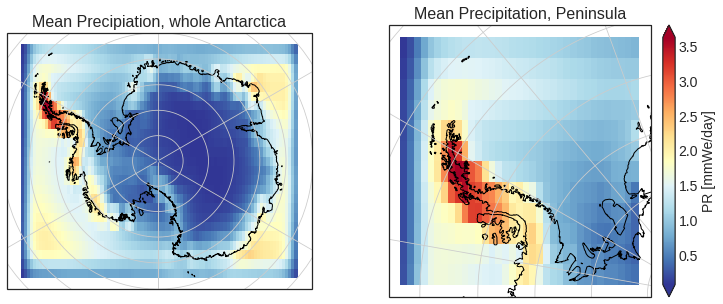

In [ ]:
fig = plt.figure(figsize= (12, 5))
ax1 = plt.subplot(1, 2, 1, projection=ccrs.SouthPolarStereo())

dsGCM = createLowerInput(GCMLike, region="Larsen", Nx=35, Ny=25, print_=False)
dsGCM = dsGCM.where(dsGCM.y > 0, drop=True)

vmin = np.nanmin([np.nanmin(GCMLike["PR"].mean(dim = 'time').values), np.nanmin(dsGCM["PR"].mean(dim = 'time').values)])
vmax = np.nanmax([np.nanmax(GCMLike["PR"].mean(dim = 'time').values), np.nanmax(dsGCM["PR"].mean(dim = 'time').values)])
GCMLike["PR"].mean(dim = 'time').plot(
        x="x",
        ax=ax1,
        transform=ccrs.SouthPolarStereo(),
        add_colorbar=False,
        vmin=vmin,
        vmax=vmax,
        cmap='RdYlBu_r',)
ax1.coastlines("10m", color="black", linewidth=1)
ax1.set_title(f"Mean Precipiation, whole Antarctica")    
ax1.gridlines()

# GCM and RCM over domains

ax2 = plt.subplot(1, 2, 2, projection=ccrs.SouthPolarStereo())
im = dsGCM["PR"].mean(dim = 'time').plot(
        x="x",
        ax=ax2,
        transform=ccrs.SouthPolarStereo(),
        add_colorbar=False,
        vmin=vmin,
        vmax=vmax,
        cmap='RdYlBu_r',)
ax2.coastlines("10m", color="black", linewidth=1)
ax2.set_title(f"Mean Precipitation, Peninsula")    
ax2.gridlines()

clb = fig.colorbar(im, ax=[ax2], fraction=0.046, pad=0.04, extend = 'both')
clb.set_label("PR [mmWe/day]")

Extreme SMB: -59.094128 30.2133
Mean SMB: -9.207557 9.957155


/usr/local/lib/python3.7/dist-packages/cartopy/crs.py:245: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  if len(multi_line_string) > 1:
/usr/local/lib/python3.7/dist-packages/cartopy/crs.py:297: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  for line in multi_line_string:
/usr/local/lib/python3.7/dist-packages/cartopy/crs.py:364: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  if len(p_mline) > 0:
/usr/local/lib/python3.7/dist-packages/cartopy/crs.py:402: ShapelyDeprecationWarning: Iteration over multi-pa

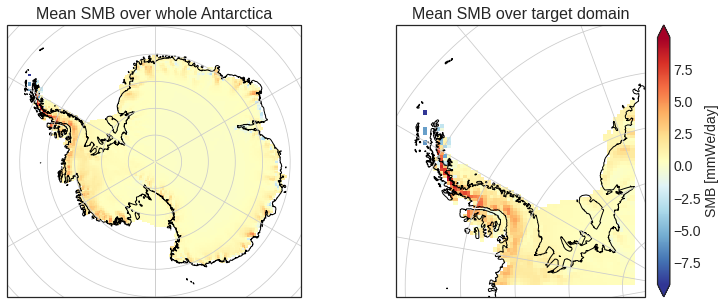

In [ ]:
fig = plt.figure(figsize = (12, 5))

# replace 0 values by NaN:
target_mean  = target_dataset.SMB.mean(dim = 'time')
target_mean_SMB = target_mean.values
target_mean_SMB[target_mean_SMB == 0] = 'nan'

target_mean_xr = xr.Dataset(coords = target_mean.coords)
target_mean_xr['SMB'] = xr.Variable(data = target_mean_SMB, dims = target_mean.dims)

# peninusula
dsmean = createLowerInput(target_mean_xr, region='Larsen', Nx=35, Ny=25, print_=False)
dsmean = dsmean.where(dsmean.y > 0, drop=True)

# extreme values of peninsula
ds = createLowerInput(target_dataset, region='Larsen', Nx=35, Ny=25, print_=False)
ds = ds.where(ds.y > 0, drop=True)

print('Extreme SMB:', np.nanmin(ds.SMB.values), np.nanmax(ds.SMB.values))
print('Mean SMB:', np.nanmin(dsmean.SMB.values), np.nanmax(dsmean.SMB.values))

vmin = min(np.nanmin(dsmean.SMB.values), np.nanmin(target_mean_xr.SMB.values))
vmax = max(np.nanmax(dsmean.SMB.values), np.nanmax(target_mean_xr.SMB.values))

ax = plt.subplot(1,2,1, projection=ccrs.SouthPolarStereo())
target_mean_xr.SMB.plot(x='x', ax = ax, transform=ccrs.SouthPolarStereo(), cmap = 'RdYlBu_r', vmin = vmin, vmax = vmax, add_colorbar=False)
ax.coastlines("10m", color="black", linewidth = 1)
ax.gridlines()
ax.set_title('Mean SMB over whole Antarctica')


ax = plt.subplot(1,2,2, projection=ccrs.SouthPolarStereo() )
im = dsmean.SMB.plot(x='x', ax = ax, transform=ccrs.SouthPolarStereo(), cmap = 'RdYlBu_r', vmin = vmin, vmax = vmax, add_colorbar=False)
ax.coastlines("10m", color="black", linewidth = 1)
clb = fig.colorbar(im, ax=[ax], fraction=0.046, pad=0.04, extend='both')
clb.set_label('SMB [mmWe/day]')  
ax.set_title('Mean SMB over target domain')
ax.gridlines()

1980-06-30


/usr/local/lib/python3.7/dist-packages/cartopy/crs.py:245: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  if len(multi_line_string) > 1:
/usr/local/lib/python3.7/dist-packages/cartopy/crs.py:297: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  for line in multi_line_string:
/usr/local/lib/python3.7/dist-packages/cartopy/crs.py:364: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  if len(p_mline) > 0:
/usr/local/lib/python3.7/dist-packages/cartopy/crs.py:402: ShapelyDeprecationWarning: Iteration over multi-pa

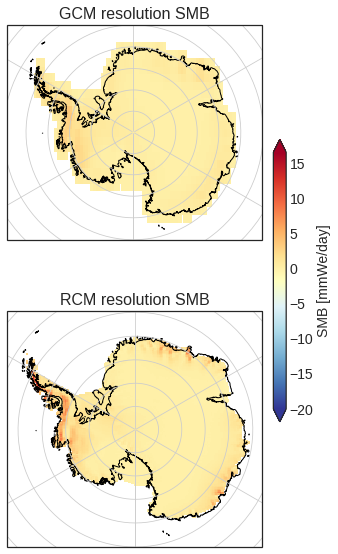

In [ ]:
fig = plt.figure(figsize = (5, 10))
var = 'SMB'
randTime = 5
dt = pd.to_datetime([GCMLike.time.isel(time=randTime).values])
time = str(dt.date[0])

# replace 0 values by NaN:
#target_mean  = target_dataset[var].mean(dim = 'time')
target_mean  = target_dataset[var].isel(time = randTime)
target_mean_SMB = target_mean.values
target_mean_SMB[target_mean_SMB == 0] = 'nan'
target_mean_xr = xr.Dataset(coords = target_mean.coords)
target_mean_xr[var] = xr.Variable(data = target_mean_SMB, dims = target_mean.dims)

# replace 0 values by NaN:
input_mean  = GCMLike[var].isel(time = randTime)
input_mean_SMB = input_mean.values
input_mean_SMB[input_mean_SMB == 0] = 'nan'
input_mean_xr = xr.Dataset(coords = input_mean.coords)
input_mean_xr[var] = xr.Variable(data = input_mean_SMB, dims = input_mean.dims)

vmin = min(np.nanmin(input_mean_xr[var].values), np.nanmin(target_mean_xr[var].values))
vmax = max(np.nanmax(input_mean_xr[var].values), np.nanmax(target_mean_xr[var].values))

cmap = 'RdYlBu_r'
ax = plt.subplot(2,1,1, projection=ccrs.SouthPolarStereo() )
im = input_mean_xr.SMB.plot(x='x', ax = ax, transform=ccrs.SouthPolarStereo(), cmap = cmap, vmin = -20, vmax = vmax, add_colorbar=False)
ax.coastlines("10m", color="black", linewidth = 1)
ax.set_title(f'GCM resolution SMB')
ax.gridlines()

ax2 = plt.subplot(2,1,2, projection=ccrs.SouthPolarStereo())
target_mean_xr.SMB.plot(x='x', ax = ax2, transform=ccrs.SouthPolarStereo(), cmap = cmap, vmin = -20, vmax = vmax, add_colorbar=False)
ax2.coastlines("10m", color="black", linewidth = 1)
ax2.gridlines()
ax2.set_title(f'RCM resolution SMB')
clb = fig.colorbar(im, ax=[ax, ax2], fraction=0.046, pad=0.04, extend='both')
clb.set_label('SMB [mmWe/day]')  
print(time)

# Larsen - Attention NRMSE RCM vs GCM:

In [ ]:
from dataFunctions import *
from makeInputs import *
from config import *
from training import *
from metrics import *
from prediction import *

%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [ ]:
# variables in GCMLike
all_vars_RCM = sorted(list(GCMLike.data_vars))
all_vars_GCM = sorted(list(GCM.data_vars))

# variables we want to train on:
vars =['PR', 'SP', 'LWD','SWD','TT', 'EW', 'NW', 'QQP']

print('Variables in GCMLike:',all_vars_RCM)
print('Variables in GCM:', sorted(list(GCM.data_vars)))
print('Variables to drop in GCMLike:', Diff(all_vars_RCM, vars))
print('Variables to drop in GCM:', Diff(all_vars_GCM, vars))

Variables in GCMLike: ['EW', 'LWD', 'NW', 'PR', 'QQP', 'RF', 'SF', 'SMB', 'SP', 'SWD', 'TT', 'TTP']
Variables in GCM: ['EW', 'LWD', 'NW', 'PR', 'QQP', 'SP', 'SWD', 'TT']
Variables to drop in GCMLike: ['RF', 'SF', 'SMB', 'TTP']
Variables to drop in GCM: []


### Load model and make predictions:

#### 1. Create test data:

Variables: ['EW', 'LWD', 'NW', 'PR', 'QQP', 'SP', 'SWD', 'TT']
Variables: ['EW', 'LWD', 'NW', 'PR', 'QQP', 'SP', 'SWD', 'TT']
Variables: ['EW', 'LWD', 'NW', 'PR', 'QQP', 'SP', 'SWD', 'TT']
Variables: ['EW', 'LWD', 'NW', 'PR', 'QQP', 'SP', 'SWD', 'TT']
Shapes of targets and inputs:
---------------------------
Target: (1452, 64, 64, 1)
Input 2D: (1452, 32, 32, 8)
Input 1D: (1452, 1, 1, 18)


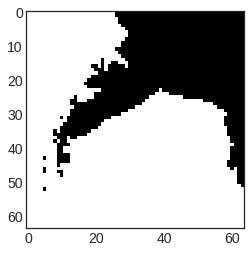

In [ ]:
REGION = "Larsen"
LOSS_ = "NRMSE"
TYPENET = "Attention"

# Make target
targets, target_times = target_maker(target_dataset, region=REGION, resize=False)

# Full target to model
full_target = np.concatenate(targets, axis=0)
target_time = np.concatenate(target_times, axis=0)
target_lon = target_dataset["x"]
target_lat = target_dataset["y"]

# Create mask over ice/land
mask = createMask(full_target[0, :, :], onechannel=True)
plt.imshow(mask)

# UPRCM input
i1D, i2D, i1D_ns, i2D_ns, VAR_LIST = make_inputs(
    GCMLike=GCMLike,
    GCM=None,
    size_input_domain=SIZE_INPUT_DOMAIN,
    Region=REGION,
    dropvarGCM=None,
    dropvarRCM=["RF", "SF", "TTP"],
)
full_input = [np.concatenate([i2D], axis=0), np.concatenate([i1D], axis=0)]
full_input_ns = [
    np.concatenate([i2D_ns], axis=0),
    np.concatenate([i1D_ns], axis=0),
]

# GCM input
i1D_GCM, i2D_GCM, i1D_ns, i2D_ns, VAR_LIST = make_inputs(
    GCMLike=GCMLike,
    GCM=GCM,
    size_input_domain=SIZE_INPUT_DOMAIN,
    Region=REGION,
    dropvarGCM=None,
    dropvarRCM=["RF", "SF", "TTP"],
)
full_input_GCM = [np.concatenate([i2D_GCM], axis=0), np.concatenate([i1D_GCM], axis=0)]

REGIONS = [REGION]

print("Shapes of targets and inputs:\n---------------------------")
print("Target:", full_target.shape)
print("Input 2D:", full_input[0].shape)
print("Input 1D:", full_input[1].shape)

#### 2. Make predictions:

In [ ]:
# Parameters used in training
trainingParam = dict(
    num_epochs=NUM_EPOCHS,
    batch_size=BATCH_SIZE,
    lr=LR,
    seed=SEED,
    amp=AMP,
    test_percent=TEST_PERCENT,
    val_percent=VAL_PERCENT,
    loss_=LOSS_,
    typeNet=TYPENET,
)
# UPRCM: Load datasets and U-Net
print('Creating UPRCM dataset:\n------------------')
train_set_UPRCM, test_set_UPRCM, net_UPRCM = trainFlow(
    full_input,
    full_target,
    mask,
    region=REGION,
    train=False,
    randomSplit=False,
    **trainingParam,
)

# GCM: Load datasets and U-Net
print('Creating GCM dataset:\n------------------')
train_set_GCM, test_set_GCM, net_GCM = trainFlow(
    full_input_GCM,
    full_target,
    mask,
    region=REGION,
    train=False,
    randomSplit=False,
    **trainingParam,
)

# Load saved model
today = str(date.today())
model = f"MODEL_{today}_{REGION}_{NUM_EPOCHS}_{BATCH_SIZE}_{TYPENET}_{LOSS_}.pth"
downloadModel = True
if downloadModel:
    # Download from google drive
    if TYPENET == "Attention":
        print("Loading from attention model")
        idModel = '1Y0XTawQXBTporNnOtib2rAaHhStrD8er'
    downloaded = Googledrive.CreateFile({"id": idModel})
    downloaded.GetContentFile(model)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Predictions on UPRCM
print('Predicting on UPRCM dataset:\n------------------')
(preds_Larsen_NRMSE,
    x_Larsen_NRMSE,
    z_Larsen_NRMSE,
    true_smb_Larsen_NRMSE,
    r_Larsen_NRMSE,
       loss_mse, 
      loss_nrmse, 
      loss_rmse
) = predict(net_UPRCM, device, test_set_UPRCM, model)

# Predictions on GCM
print('Predicting on GCM dataset:\n------------------')
(preds_Larsen_NRMSE_GCM,
    x_Larsen_NRMSE_GCM,
    z_Larsen_NRMSE_GCM,
    true_smb_Larsen_NRMSE_GCM,
    r_Larsen_NRMSE_GCM,
       loss_mse, 
      loss_nrmse, 
      loss_rmse
) = predict(net_GCM, device, test_set_GCM, model)

INFO: Using device cpu
INFO: Attention SmAt_UNet model


Creating UPRCM dataset:
------------------


INFO: Network:
	8 input channels X
	18 input channels Z
	Transposed conv upscaling
INFO: X shape: torch.Size([1452, 8, 32, 32])
INFO: Test set size: 120
Train set size: 1332

INFO: Using device cpu
INFO: Attention SmAt_UNet model


Creating GCM dataset:
------------------


INFO: Network:
	8 input channels X
	18 input channels Z
	Transposed conv upscaling
INFO: X shape: torch.Size([1452, 8, 32, 32])
INFO: Test set size: 120
Train set size: 1332



Loading from attention model


INFO: Loading saved model MODEL_2022-06-24_Larsen_100_32_Attention_NRMSE.pth
INFO: Using device cpu
INFO: Saved model loaded!


Predicting on UPRCM dataset:
------------------


INFO: Loading saved model MODEL_2022-06-24_Larsen_100_32_Attention_NRMSE.pth
INFO: Using device cpu
INFO: Saved model loaded!


Predicting on GCM dataset:
------------------


### Geoplots:

/usr/local/lib/python3.7/dist-packages/cartopy/crs.py:245: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  if len(multi_line_string) > 1:
/usr/local/lib/python3.7/dist-packages/cartopy/crs.py:297: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  for line in multi_line_string:
/usr/local/lib/python3.7/dist-packages/cartopy/crs.py:364: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  if len(p_mline) > 0:


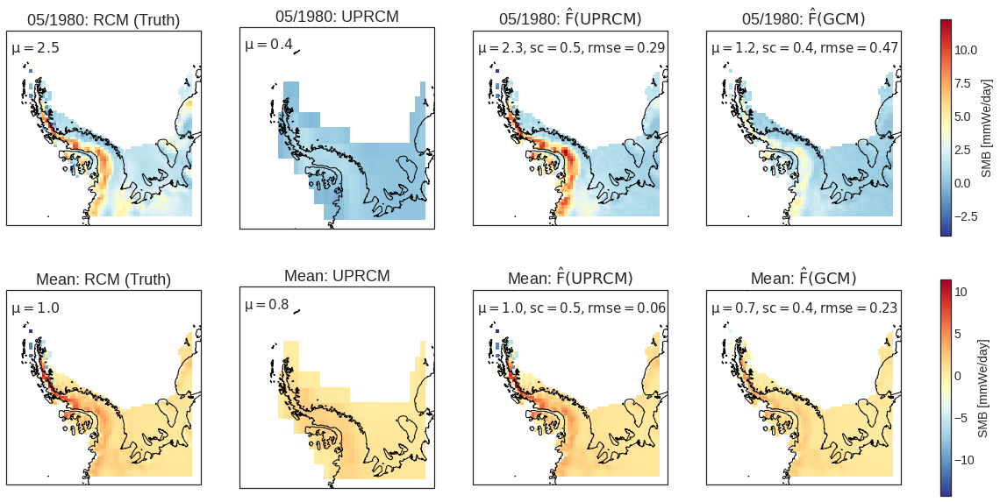

In [ ]:
points_RCM = (
    {"x": 16, "y": 32},
    {"x": 27, "y": 22},
    {"x": 31, "y": 26},
    {"x": 52, "y": 17},
)
plotRandomPrediction(
    preds_Larsen_NRMSE,
    preds_Larsen_NRMSE_GCM,
    true_smb_Larsen_NRMSE_GCM,
    r_Larsen_NRMSE_GCM,
    GCMLike,
    target_dataset,
    points_RCM,
    figsize = (20, 10),
    fontsize_axes = 18,
    fontsize_suptitle = 24,
)

### Timeseries:

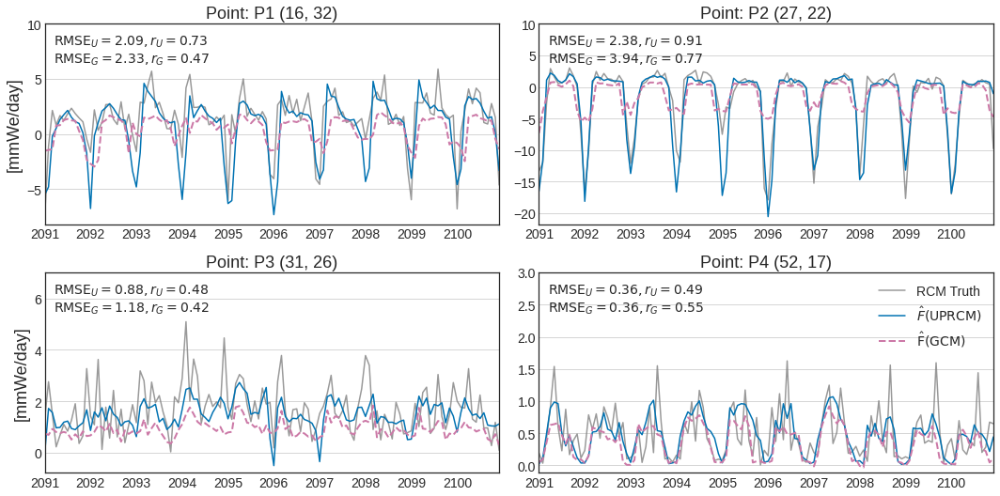

In [ ]:
from prediction import *
points_RCM = (
    {"x": 16, "y": 32},
    {"x": 27, "y": 22},
    {"x": 31, "y": 26},
    {"x": 52, "y": 17},
)

metrics = plotTimeseries2Models(
    preds_Larsen_NRMSE,
    preds_Larsen_NRMSE_GCM,
    true_smb_Larsen_NRMSE,
    train_set_GCM,
    target_dataset,
    points_RCM,
    REGION,
    len(points_RCM),
    figsize=(15, 11),
    labels = ['$\operatorname{\hat{F}(UPRCM)}$', '$\mathrm{\hat{F}(GCM)}$']
)

### Annual SMB:

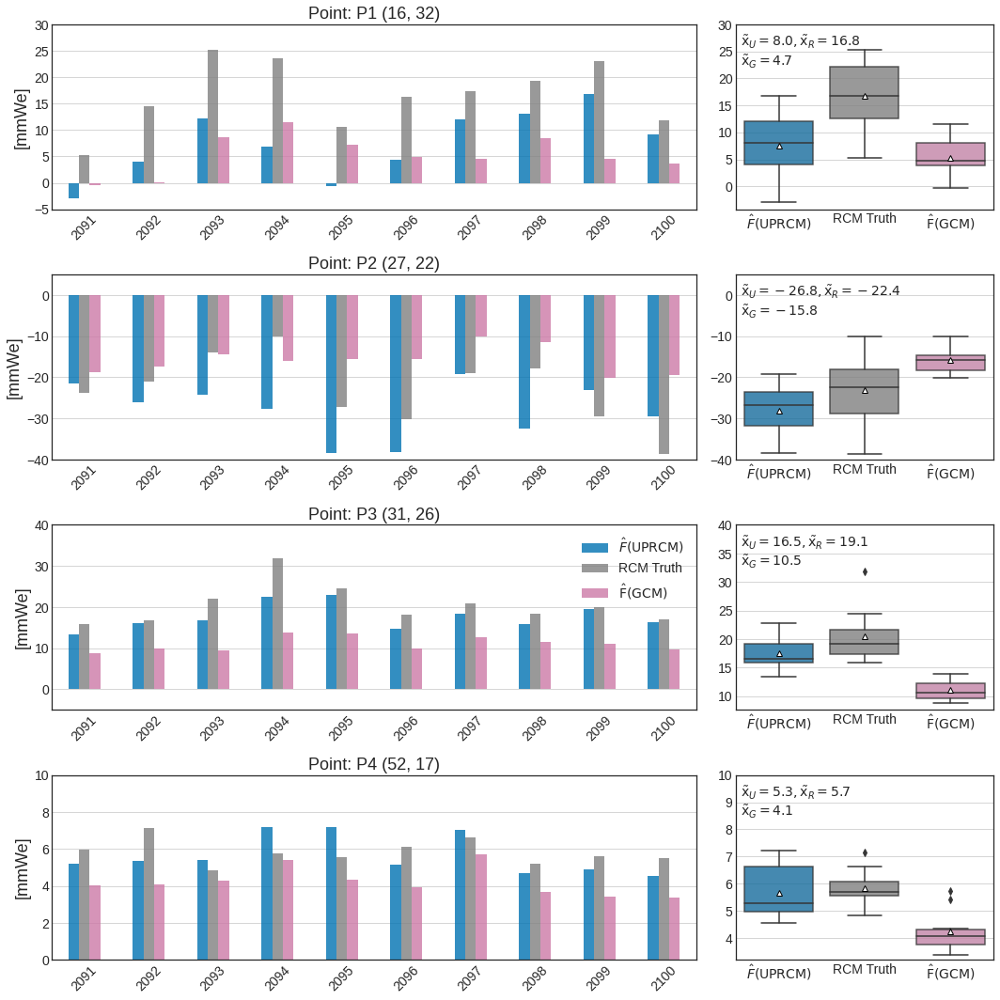

In [ ]:
metrics = annualSMB(
    preds_Larsen_NRMSE,
    true_smb_Larsen_NRMSE,
    train_set_UPRCM,
    target_dataset,
    points_RCM,
    predsGCM=preds_Larsen_NRMSE_GCM,
    figsize = (15, 15),
    labels = ['$\operatorname{\hat{F}(UPRCM)}$', '$\mathrm{\hat{F}(GCM)}$']
)

### Compare metrics:

In [ ]:
PearsonCorr, Wasserstein, ROV, MSE, RMSE, NRMSE, PearsonCorrAn, ROD = calculateMetrics(
    preds_Larsen_NRMSE,
    true_smb_Larsen_NRMSE,
    target_dataset,
    train_set_UPRCM,
    REGION,
    ignoreSea=True,
)

PearsonCorr_GCM, Wasserstein_GCM, ROV_GCM, MSE_GCM, RMSE_GCM, NRMSE_GCM, PearsonCorrAn_GCM, ROD_GCM = calculateMetrics(
    preds_Larsen_NRMSE_GCM,
    true_smb_Larsen_NRMSE,
    target_dataset,
    train_set_GCM,
    REGION,
    ignoreSea=True,
)

/usr/local/lib/python3.7/dist-packages/numpy/lib/function_base.py:2691: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.7/dist-packages/numpy/lib/function_base.py:2692: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]
/content/metrics.py:40: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  predictions = torch.tensor(preds).clone().detach()
/content/metrics.py:41: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  target = torch.tensor(true_smb).clone().detach()
/usr/local/lib/python3.7/dist-packages/numpy/lib/function_base.py:2691: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]


[autoreload of prediction failed: Traceback (most recent call last):
  File "/usr/local/lib/python3.7/dist-packages/IPython/extensions/autoreload.py", line 247, in check
    superreload(m, reload, self.old_objects)
  File "/content/prediction.py", line 885
    plotWasserstein(
    ^
IndentationError: unexpected indent
]
/usr/local/lib/python3.7/dist-packages/cartopy/crs.py:245: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  if len(multi_line_string) > 1:
/usr/local/lib/python3.7/dist-packages/cartopy/crs.py:297: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  for line in multi_line_string:
/usr/local/lib/python3.7/dist-packages/cartopy/crs.py:364: ShapelyDeprecationWarnin

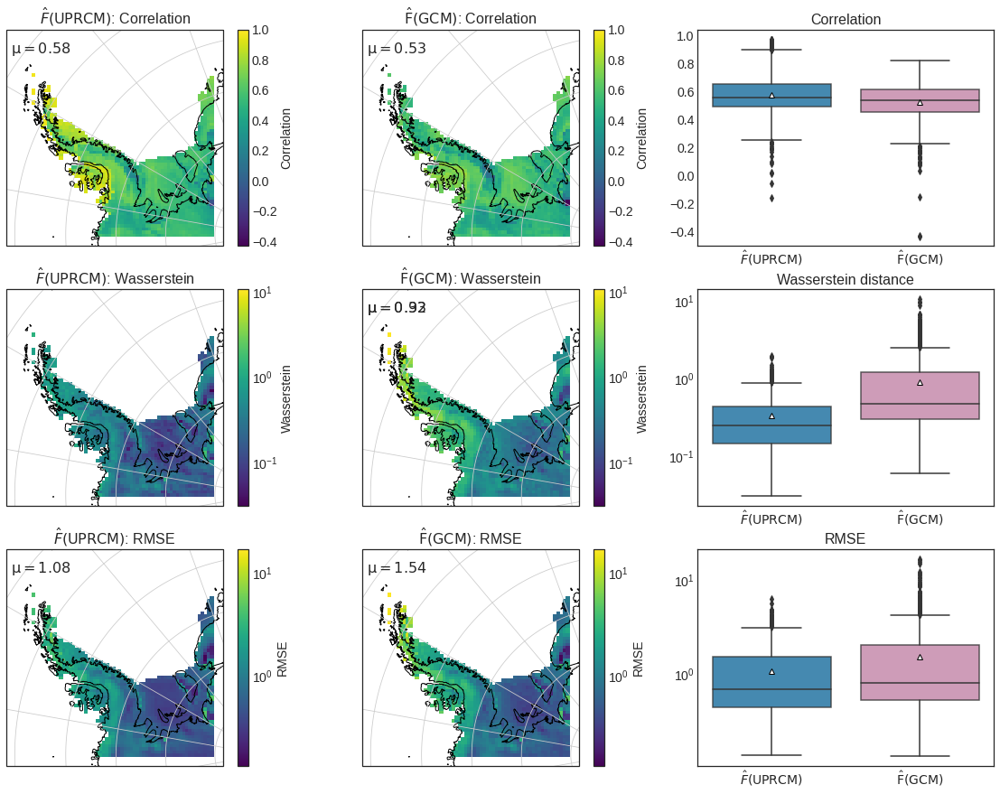

In [ ]:
from metrics import * 
CompareMetrics(
    [PearsonCorr, PearsonCorr_GCM],
    [Wasserstein, Wasserstein_GCM],
    [RMSE, RMSE_GCM],
    [NRMSE, NRMSE_GCM], 
    target_dataset,
    region = 'Larsen', models = ['$\operatorname{\hat{F}(UPRCM)}$', '$\mathrm{\hat{F}(GCM)}$'], figsize =(20, 15))

### Correlation plots:

In [ ]:
"""
import itertools
variables = ['SP', 'LWD', 'SWD', 'TT', 'QQP', 'PR', 'NW', 'EW']
list_comb = []
for i in range(2, 3):
    combinations = itertools.combinations(variables, i)
    for comb in combinations:
      list_comb.append([el for el in comb])

# positions of variables:
positions = {}
for i, var in enumerate(variables):
  positions[var] = i
positions"""

{'EW': 7, 'LWD': 1, 'NW': 6, 'PR': 5, 'QQP': 4, 'SP': 0, 'SWD': 2, 'TT': 3}

In [ ]:
"""LarsenGCMLike = createLowerInput(GCMLike, region="Larsen", Nx=48, Ny=25, print_=False)
LarsenGCMLike = LarsenGCMLike.where(LarsenGCMLike.y>0, drop=True)
LarsenGCM = createLowerInput(GCM, region="Larsen", Nx=48, Ny=25, print_=False)
LarsenGCM = LarsenGCM.where(LarsenGCM.y>0, drop=True)"""

#### Correlation between variables:

Don't know how much this makes sense because variables don't have the same range, maybe should normalise them before?

In [ ]:
"""# Mean spatial correlation between images for each time step and between variables: (upper triangle)
from sewar.full_ref import mse, rmse, psnr, uqi, ssim, ergas, scc, rase, sam, msssim, vifp
list_vars = ['SP', 'LWD', 'SWD', 'TT', 'QQP', 'PR', 'NW', 'EW']

corr_matrix = np.zeros((len(list_vars), len(list_vars)))
for j in tqdm(range(len(list_comb))):
  varcomb = list_comb[j]
  var1 = varcomb[0]
  var2 = varcomb[1]
  t_arr = []
  for t in range(LarsenGCMLike.dims['time']):
      im1 = LarsenGCMLike[var1].isel(time = t).values
      im2 = LarsenGCMLike[var2].isel(time = t).values
      t_arr.append(scc(im1, im2)) # spatial correlation
  corr_matrix[positions[var1],positions[var2]] = np.mean(t_arr)

corr_df = pd.DataFrame(corr_matrix, columns = list_vars, index = list_vars)

# Matrix mean over all positions x,y and compare mean time series between variables (lower triangle)
spatialMeanUPRCM = LarsenGCMLike.mean(dim = ['x','y']).to_dataframe().drop(['spatial_ref', 'TTP', 'SF', 'RF','SMB'], axis = 1)
corr_temp = spatialMeanUPRCM.corr()

mask = np.tril(np.ones_like(corr_temp, dtype=bool))
corr_temp_spat = mask*corr_temp+corr_df"""

 11%|█         | 3/28 [00:08<01:10,  2.81s/it]/usr/local/lib/python3.7/dist-packages/sewar/utils.py:18: UserWarning: Supplied images have different dtypes float32 and float64
  warnings.warn(msg)
 11%|█         | 3/28 [00:09<01:22,  3.29s/it]


KeyboardInterrupt: ignored

In [ ]:
"""# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(11, 9))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(230, 20, as_cmap=True)

mask = np.tril(np.ones_like(corr_df, dtype=bool))

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr_temp_spat, cmap=cmap, vmax=1, vmin = -1, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5}, annot=True)"""

#### Correlation between GCM - UPRCM:
Look at spatial correlation betwen GCM and UPRCM images for all variables.

In [ ]:
"""import itertools
variables = ['SP', 'LWD', 'SWD', 'TT', 'QQP', 'PR', 'NW', 'EW']
list_comb = []
for i in range(2, 3):
    combinations = itertools.combinations(variables, i)
    for comb in combinations:
      list_comb.append([el for el in comb])
for var in variables:
  list_comb.append([var, var])

# positions of variables:
positions = {}
for i, var in enumerate(variables):
  positions[var] = i"""

In [ ]:
"""# Mean spatial correlation between images for each time step and between variables: (upper triangle)
from sewar.full_ref import mse, rmse, psnr, uqi, ssim, ergas, scc, rase, sam, msssim, vifp
list_vars = ['SP', 'LWD', 'SWD', 'TT', 'QQP', 'PR', 'NW', 'EW']

corr_matrix = np.zeros((len(list_vars), len(list_vars)))
for j in tqdm(range(len(list_comb))):
  varcomb = list_comb[j]
  var1 = varcomb[0]
  var2 = varcomb[1]
  t_arr = []
  for t in range(GCMLike.dims['time']):
      im1 = LarsenGCM[var1].isel(time = t).values
      im2 = LarsenGCMLike[var2].isel(time = t).values
      t_arr.append(scc(im1, im2)) # spatial correlation
  corr_matrix[positions[var1],positions[var2]] = np.mean(t_arr)

corr_df = pd.DataFrame(corr_matrix, columns = list_vars, index = list_vars)
corr_df"""

In [ ]:
"""# Mean temporal correlation: 
# Matrix mean over all positions x,y and compare mean time series between variables (lower triangle)
spatialMeanUPRCM = LarsenGCMLike.mean(dim = ['x','y']).to_dataframe().drop(['spatial_ref', 'TTP', 'SF', 'RF','SMB'], axis = 1)
spatialMeanGCM = LarsenGCMLike.mean(dim = ['x','y']).to_dataframe().drop(['spatial_ref', 'TTP', 'SF', 'RF','SMB'], axis = 1)

list_vars = ['SP', 'LWD', 'SWD', 'TT', 'QQP', 'PR', 'NW', 'EW']

corr_matrix = np.zeros((len(list_vars), len(list_vars)))
for j in tqdm(range(len(list_comb))):
  varcomb = list_comb[j]
  var1 = varcomb[0]
  var2 = varcomb[1]
  ts1 = spatialMeanGCM[var1].values
  ts2 = spatialMeanUPRCM[var2].values
  corr_matrix[positions[var1],positions[var2]] = np.corrcoef(ts1, ts2)[0, 1]

corr_df_temp = pd.DataFrame(corr_matrix, columns = list_vars, index = list_vars)
corr_df_temp = corr_df_temp.transpose()

mask = np.tril(np.ones_like(corr_df_temp, dtype=bool))
corr_temp_spat = mask*corr_df_temp
corr_temp_spat = corr_temp_spat+corr_df-np.eye(M=len(list_vars), N=len(list_vars))

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(11, 9))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(230, 20, as_cmap=True)

#mask = np.tril(np.ones_like(corr_df, dtype=bool))

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr_temp_spat, cmap=cmap, vmax=1, vmin = -1, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5}, annot=True)

ax.set_ylabel('GCM')
ax.set_xlabel('UPRCM')
ax.set_title('UT+diag: mean spatial correlation, LT: temporal correlation')"""

### Correlation maps:

In [ ]:
LarsenGCMLike = createLowerInput(GCMLike, region="Larsen", Nx=48, Ny=25, print_=False)
LarsenGCMLike = LarsenGCMLike.where(LarsenGCMLike.y>0, drop=True)
LarsenGCM = createLowerInput(GCM, region="Larsen", Nx=48, Ny=25, print_=False)
LarsenGCM = LarsenGCM.where(LarsenGCM.y>0, drop=True)

#### Temporal correlation between GCM and UPRCM:

In [ ]:
var1.shape

(1452, 12, 48, 1)

/usr/local/lib/python3.7/dist-packages/cartopy/crs.py:245: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  if len(multi_line_string) > 1:
/usr/local/lib/python3.7/dist-packages/cartopy/crs.py:297: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  for line in multi_line_string:
/usr/local/lib/python3.7/dist-packages/cartopy/crs.py:364: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  if len(p_mline) > 0:
/usr/local/lib/python3.7/dist-packages/cartopy/crs.py:402: ShapelyDeprecationWarning: Iteration over multi-pa

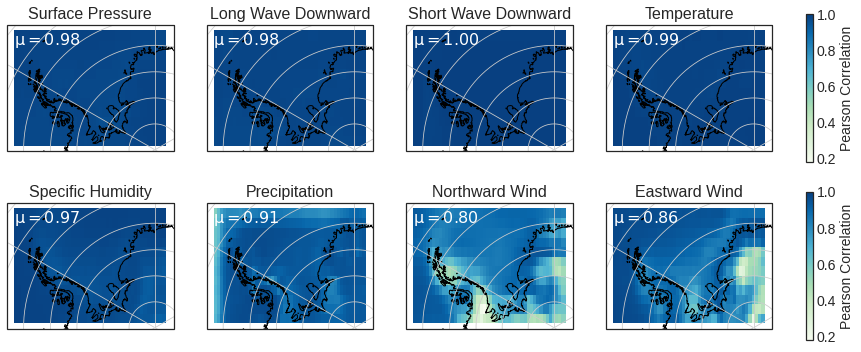

In [ ]:
variables = ['SP', 'LWD', 'SWD', 'TT', 'QQP', 'PR', 'NW', 'EW']
longNames = ['Surface Pressure', 'Long Wave Downward', 'Short Wave Downward', 
             'Temperature', 'Specific Humidity', 'Precipitation', 'Northward Wind', 'Eastward Wind']

mins, maxs = [], []
for var in variables:
  var1 = np.expand_dims(LarsenGCMLike[var].values,3)
  var2 = np.expand_dims(LarsenGCM[var].values,3)
  p = calculatePearson(var1, var2, ignoreSea=True)
  mins.append(np.nanmin(p))
  maxs.append(np.nanmax(p))

fig = plt.figure(figsize = (15, 6))
axs=[]
axs2 = []
for i, var in enumerate(variables):
  var1 = np.expand_dims(LarsenGCMLike[var].values,3)
  var2 = np.expand_dims(LarsenGCM[var].values,3)
  pearson = calculatePearson(var1, var2, ignoreSea=True)
  ax = plt.subplot(2,4,i+1, projection=ccrs.SouthPolarStereo())
  if i+1 < 5:
    axs.append(ax)
  else:
    axs2.append(ax)

  im = plotPearsonCorr(GCMLike, pearson, ax = ax, vmin = np.nanmin(mins), 
                  vmax = np.nanmax(maxs), 
                  mean = np.nanmean(pearson), type = 'GCM', colorbar = False)
  
  ax.set_title('{}'.format(longNames[i]), fontsize = 16)
  textstrBoxplots = "\n".join((r"$\mathrm{\mu}=%.2f$"% (np.nanmean(pearson)),))
  ax.text(0.04, 0.95,textstrBoxplots,
          transform=ax.transAxes,
          fontsize=16,
          verticalalignment="top", color = 'white')

clb = fig.colorbar(im, ax=axs, fraction=0.046, pad=0.04)
clb.set_label("Pearson Correlation")
clb2 = fig.colorbar(im, ax=axs2, fraction=0.046, pad=0.04)
clb2.set_label("Pearson Correlation")
#plt.suptitle('Temporal correlation between GCM and UPRCM variables')

#### Spatial correlation for each timestep:

/usr/local/lib/python3.7/dist-packages/sewar/utils.py:18: UserWarning: Supplied images have different dtypes float32 and float64
  warnings.warn(msg)
/usr/local/lib/python3.7/dist-packages/cartopy/crs.py:245: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  if len(multi_line_string) > 1:
/usr/local/lib/python3.7/dist-packages/cartopy/crs.py:297: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  for line in multi_line_string:
/usr/local/lib/python3.7/dist-packages/cartopy/crs.py:364: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a mul

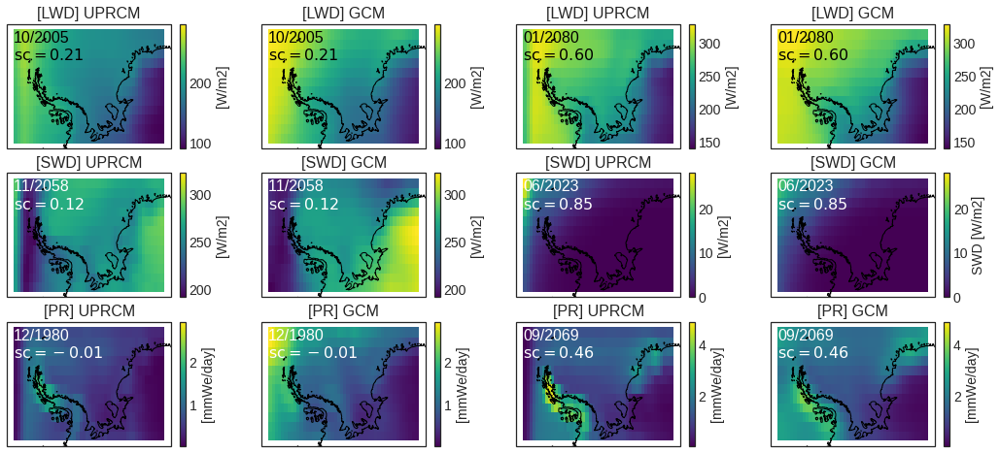

In [ ]:
fig = plt.figure(figsize = (18, 8))

var = 'LWD'
time = '2005-10-31'
timeshort = '10/2005'
im1 = LarsenGCMLike[var].sel(time = time).values
im2 = LarsenGCM[var].sel(time = time).values
ax1= plt.subplot(3,4,1, projection=ccrs.SouthPolarStereo())
cl = LarsenGCMLike[var].sel(time = time).plot(ax=ax1,
        x="x",
        transform=ccrs.SouthPolarStereo(),
        add_colorbar=False,
        vmin = np.nanmin([im1, im2]),
        vmax = np.nanmax([im1, im2]))
ax1.set_title(f'[LWD] UPRCM')
textstrBoxplots = "\n".join((f"{timeshort}", r"$\mathrm{sc}=%.2f$"% (scc(im1, im2))))
ax1.text(0.04, 0.95,textstrBoxplots,
        transform=ax1.transAxes,
        fontsize=16,
        verticalalignment="top", color = 'black')
clb = fig.colorbar(cl, ax=[ax1], fraction=0.046, pad=0.04)
clb.set_label("[W/m2]")

ax2= plt.subplot(3,4,2, projection=ccrs.SouthPolarStereo())
cl = LarsenGCM[var].sel(time = time).plot(ax=ax2,
        x="x",
        transform=ccrs.SouthPolarStereo(),
        add_colorbar=False,
        vmin = np.nanmin([im1, im2]),
        vmax = np.nanmax([im1, im2]))
ax2.set_title('[LWD] GCM')
textstrBoxplots = "\n".join((f"{timeshort}",r"$\mathrm{sc}=%.2f$"% (scc(im1, im2)),))
ax2.text(0.04, 0.95,textstrBoxplots,
        transform=ax2.transAxes,
        fontsize=16,
        verticalalignment="top", color = 'black')
clb = fig.colorbar(cl, ax=[ax2], fraction=0.046, pad=0.04)
clb.set_label("[W/m2]")

time = '2080-01-31'
timeshort = '01/2080'
im1 = LarsenGCMLike[var].sel(time = time).values
im2 = LarsenGCM[var].sel(time = time).values

ax3 = plt.subplot(3,4,3, projection=ccrs.SouthPolarStereo())
cl = LarsenGCMLike[var].sel(time = time).plot(ax=ax3,
        x="x",
        transform=ccrs.SouthPolarStereo(),
        add_colorbar=False, 
        vmin = np.nanmin([im1, im2]),
        vmax = np.nanmax([im1, im2]))
ax3.set_title(f'[LWD] UPRCM')
textstrBoxplots = "\n".join((f"{timeshort}",r"$\mathrm{sc}=%.2f$"% (scc(im1, im2)),))
ax3.text(0.04, 0.95,textstrBoxplots,
        transform=ax3.transAxes,
        fontsize=16,
        verticalalignment="top", color = 'black')
clb = fig.colorbar(cl, ax=[ax3], fraction=0.046, pad=0.04)
clb.set_label("[W/m2]")

ax4 = plt.subplot(3,4,4, projection=ccrs.SouthPolarStereo())
cl = LarsenGCM[var].sel(time = time).plot(ax=ax4,
        x="x",
        transform=ccrs.SouthPolarStereo(),
        add_colorbar=False,
        vmin = np.nanmin([im1, im2]),
        vmax = np.nanmax([im1, im2]))
ax4.set_title('[LWD] GCM')
textstrBoxplots = "\n".join((f"{timeshort}",r"$\mathrm{sc}=%.2f$"% (scc(im1, im2)),))
ax4.text(0.04, 0.95,textstrBoxplots,
        transform=ax4.transAxes,
        fontsize=16,
        verticalalignment="top", color = 'black')
clb = fig.colorbar(cl, ax=[ax4], fraction=0.046, pad=0.04)
clb.set_label("[W/m2]")

var = 'SWD'
time = '2058-11-30'
timeshort = '11/2058'
im1 = LarsenGCMLike[var].sel(time = time).values
im2 = LarsenGCM[var].sel(time = time).values
ax5= plt.subplot(3,4,5, projection=ccrs.SouthPolarStereo())
cl = LarsenGCMLike[var].sel(time = time).plot(ax=ax5,
        x="x",
        transform=ccrs.SouthPolarStereo(),
        add_colorbar=False,
        vmin = np.nanmin([im1, im2]),
        vmax = np.nanmax([im1, im2]))
ax5.set_title(f'[SWD] UPRCM')
textstrBoxplots = "\n".join((f"{timeshort}",r"$\mathrm{sc}=%.2f$"% (scc(im1, im2)),))
ax5.text(0.04, 0.95,textstrBoxplots,
        transform=ax5.transAxes,
        fontsize=16,
        verticalalignment="top", color = 'white')
clb = fig.colorbar(cl, ax=[ax5], fraction=0.046, pad=0.04)
clb.set_label("[W/m2]")

ax6= plt.subplot(3,4,6, projection=ccrs.SouthPolarStereo())
cl = LarsenGCM[var].sel(time = time).plot(ax=ax6,
        x="x",
        transform=ccrs.SouthPolarStereo(),
        add_colorbar=False,
        vmin = np.nanmin([im1, im2]),
        vmax = np.nanmax([im1, im2]))
ax6.set_title('[SWD] GCM')
textstrBoxplots = "\n".join((f"{timeshort}",r"$\mathrm{sc}=%.2f$"% (scc(im1, im2)),))
ax6.text(0.04, 0.95,textstrBoxplots,
        transform=ax6.transAxes,
        fontsize=16,
        verticalalignment="top", color = 'white')

clb = fig.colorbar(cl, ax=[ax6], fraction=0.046, pad=0.04)
clb.set_label("[W/m2]")

time = '2023-06-30'
timeshort = '06/2023'
im1 = LarsenGCMLike[var].sel(time = time).values
im2 = LarsenGCM[var].sel(time = time).values

ax7 = plt.subplot(3,4,7, projection=ccrs.SouthPolarStereo())
cl = LarsenGCMLike[var].sel(time = time).plot(ax=ax7,
        x="x",
        transform=ccrs.SouthPolarStereo(),
        add_colorbar=False, 
        vmin = np.nanmin([im1, im2]),
        vmax = np.nanmax([im1, im2]))
ax7.set_title(f'[SWD] UPRCM')
textstrBoxplots = "\n".join((f"{timeshort}",r"$\mathrm{sc}=%.2f$"% (scc(im1, im2)),))
ax7.text(0.04, 0.95,textstrBoxplots,
        transform=ax7.transAxes,
        fontsize=16,
        verticalalignment="top", color = 'white')
clb = fig.colorbar(cl, ax=[ax7], fraction=0.046, pad=0.04)
clb.set_label("[W/m2]")

ax8 = plt.subplot(3,4,8, projection=ccrs.SouthPolarStereo())
cl = LarsenGCM[var].sel(time = time).plot(ax=ax8,
        x="x",
        transform=ccrs.SouthPolarStereo(),
        add_colorbar=False,
        vmin = np.nanmin([im1, im2]),
        vmax = np.nanmax([im1, im2]))
ax8.set_title('[SWD] GCM')
textstrBoxplots = "\n".join((f"{timeshort}",r"$\mathrm{sc}=%.2f$"% (scc(im1, im2)),))
ax8.text(0.04, 0.95,textstrBoxplots,
        transform=ax8.transAxes,
        fontsize=16,
        verticalalignment="top", color = 'white')
clb = fig.colorbar(cl, ax=[ax8], fraction=0.046, pad=0.04)
clb.set_label("SWD [W/m2]")


var = 'PR'
time = '1980-12-31'
timeshort = '12/1980'
im1 = LarsenGCMLike[var].sel(time = time).values
im2 = LarsenGCM[var].sel(time = time).values
ax9= plt.subplot(3,4,9, projection=ccrs.SouthPolarStereo())
cl = LarsenGCMLike[var].sel(time = time).plot(ax=ax9,
        x="x",
        transform=ccrs.SouthPolarStereo(),
        add_colorbar=False,
        vmin = np.nanmin([im1, im2]),
        vmax = np.nanmax([im1, im2]))
ax9.set_title(f'[PR] UPRCM')
textstrBoxplots = "\n".join((f"{timeshort}",r"$\mathrm{sc}=%.2f$"% (scc(im1, im2)),))
ax9.text(0.04, 0.95,textstrBoxplots,
        transform=ax9.transAxes,
        fontsize=16,
        verticalalignment="top", color = 'white')
clb = fig.colorbar(cl, ax=[ax9], fraction=0.046, pad=0.04)
clb.set_label("[mmWe/day]")

ax10= plt.subplot(3,4,10, projection=ccrs.SouthPolarStereo())
cl = LarsenGCM[var].sel(time = time).plot(ax=ax10,
        x="x",
        transform=ccrs.SouthPolarStereo(),
        add_colorbar=False,
        vmin = np.nanmin([im1, im2]),
        vmax = np.nanmax([im1, im2]))
ax10.set_title('[PR] GCM')
textstrBoxplots = "\n".join((f"{timeshort}",r"$\mathrm{sc}=%.2f$"% (scc(im1, im2)),))
ax10.text(0.04, 0.95,textstrBoxplots,
        transform=ax10.transAxes,
        fontsize=16,
        verticalalignment="top", color = 'white')
clb = fig.colorbar(cl, ax=[ax10], fraction=0.046, pad=0.04)
clb.set_label("[mmWe/day]")

time = '2069-09-30'
timeshort = '09/2069'
im1 = LarsenGCMLike[var].sel(time = time).values
im2 = LarsenGCM[var].sel(time = time).values

ax11 = plt.subplot(3,4,11, projection=ccrs.SouthPolarStereo())
cl = LarsenGCMLike[var].sel(time = time).plot(ax=ax11,
        x="x",
        transform=ccrs.SouthPolarStereo(),
        add_colorbar=False, 
        vmin = np.nanmin([im1, im2]),
        vmax = np.nanmax([im1, im2]))
ax11.set_title(f'[PR] UPRCM')
textstrBoxplots = "\n".join((f"{timeshort}",r"$\mathrm{sc}=%.2f$"% (scc(im1, im2)),))
ax11.text(0.04, 0.95,textstrBoxplots,
        transform=ax11.transAxes,
        fontsize=16,
        verticalalignment="top", color = 'white')
clb = fig.colorbar(cl, ax=[ax11], fraction=0.046, pad=0.04)
clb.set_label("[mmWe/day]")

ax12 = plt.subplot(3,4,12, projection=ccrs.SouthPolarStereo())
cl = LarsenGCM[var].sel(time = time).plot(ax=ax12,
        x="x",
        transform=ccrs.SouthPolarStereo(),
        add_colorbar=False,
        vmin = np.nanmin([im1, im2]),
        vmax = np.nanmax([im1, im2]))
ax12.set_title('[PR] GCM')
textstrBoxplots = "\n".join((f"{timeshort}",r"$\mathrm{sc}=%.2f$"% (scc(im1, im2)),))
ax12.text(0.04, 0.95,textstrBoxplots,
        transform=ax12.transAxes,
        fontsize=16,
        verticalalignment="top", color = 'white')
clb = fig.colorbar(cl, ax=[ax12], fraction=0.046, pad=0.04)
clb.set_label("[mmWe/day]")



for ax in [ax1, ax2, ax3, ax4, ax5, ax6, ax7, ax8, ax9, ax10, ax11, ax12]:
  ax.coastlines("10m", color="black", linewidth = 1)
  #ax.gridlines()

#plt.suptitle('Spatial correlation between UPRCM and GCM for three variables', fontsize = 18)

/usr/local/lib/python3.7/dist-packages/sewar/utils.py:18: UserWarning: Supplied images have different dtypes float32 and float64
  warnings.warn(msg)
/usr/local/lib/python3.7/dist-packages/sewar/utils.py:18: UserWarning: Supplied images have different dtypes float64 and float32
  warnings.warn(msg)
/usr/local/lib/python3.7/dist-packages/sewar/utils.py:18: UserWarning: Supplied images have different dtypes float32 and float64
  warnings.warn(msg)
/usr/local/lib/python3.7/dist-packages/sewar/utils.py:18: UserWarning: Supplied images have different dtypes float32 and float64
  warnings.warn(msg)


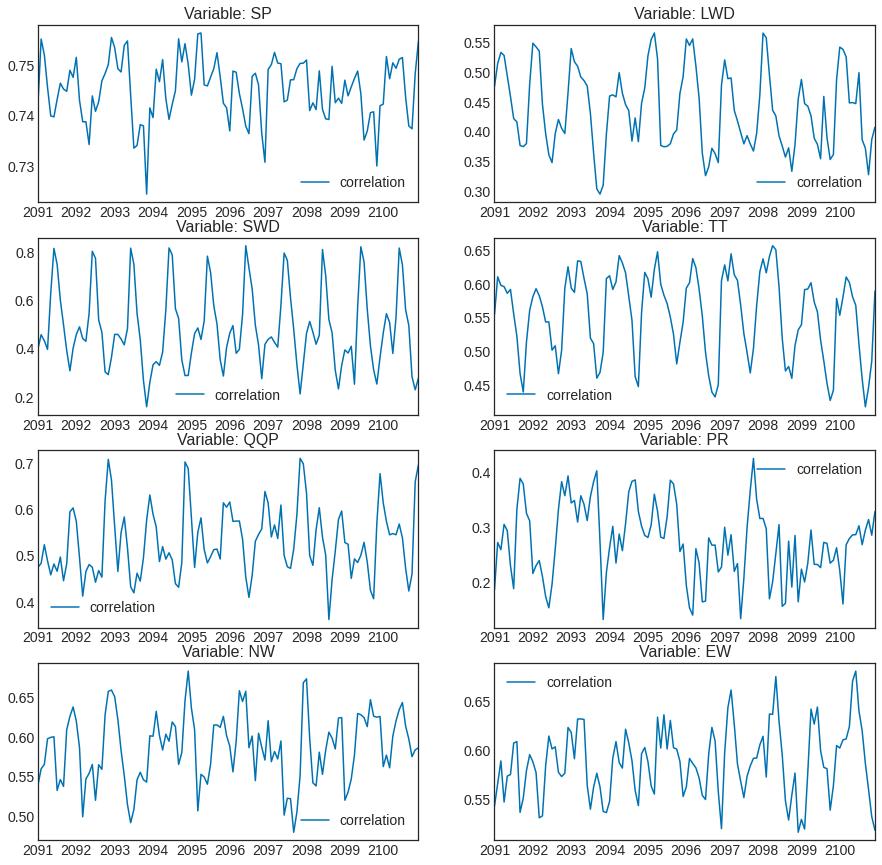

In [ ]:
#testTime = LarsenGCMLike.time.values
testTime = LarsenGCMLike.isel(time = slice(len(train_set_UPRCM), LarsenGCMLike.dims['time'])).time.values
df = pd.DataFrame(index=testTime,)
colors = ['#0072B2', '#009E73', '#D55E00', '#CC79A7', '#F0E442', '#56B4E9']

correlations = pd.DataFrame(index=testTime,)
list_vars = ['SP', 'LWD', 'SWD', 'TT', 'QQP', 'PR', 'NW', 'EW']

fig = plt.figure(figsize = (15, 15))
for i, var in enumerate(list_vars):
  c_arr, r_arr = [], []
  for t in testTime:
    im1 = LarsenGCM[var].sel(time = t).values
    im2 = LarsenGCMLike[var].sel(time = t).values
    c_arr.append(scc(im1, im2)) # spatial correlation
    r_arr.append(rmse(im1, im2)) # spatial correlation
  df['correlation'] = c_arr
  df['rmse'] = r_arr
  correlations[var] = c_arr
  ax = plt.subplot(4,2, i+1)
  ax.grid(axis = 'y')
  ax.set_title(f'Variable: {var}')
  df['correlation'].plot(ax = ax, color = colors[0], label = 'correlation')
  #ax2=ax.twinx()
  #df['rmse'].plot(ax = ax2, color = colors[1], label = 'rmse', linestyle = '--')
  ax.legend()
  #ax2.legend()

In [ ]:
var = 'PR'
minvalue = np.abs(correlations[var]).argmin()
maxvalue = np.abs(correlations[var]).argmax()
correlations.index[minvalue], correlations.index[maxvalue]

(Timestamp('1980-12-31 00:00:00'), Timestamp('2069-09-30 00:00:00'))

### Feature importance:

Variables: ['EW', 'LWD', 'NW', 'PR', 'QQP', 'SP', 'SWD', 'TT']
Variables: ['EW', 'LWD', 'NW', 'PR', 'QQP', 'SP', 'SWD', 'TT']


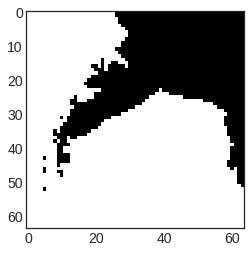

In [ ]:
REGION = "Larsen"
LOSS_ = "NRMSE"
TYPENET = "Attention"

# Make target
targets, target_times = target_maker(target_dataset, region=REGION, resize=False)

# Full target to model
full_target = np.concatenate(targets, axis=0)
target_time = np.concatenate(target_times, axis=0)
target_lon = target_dataset["x"]
target_lat = target_dataset["y"]

# Create mask over ice/land
mask = createMask(full_target[0, :, :], onechannel=True)
plt.imshow(mask)

# UPRCM input
i1D, i2D, i1D_ns, i2D_ns, VAR_LIST = make_inputs(
    GCMLike=GCMLike,
    GCM=None,
    size_input_domain=SIZE_INPUT_DOMAIN,
    Region=REGION,
    dropvarGCM=None,
    dropvarRCM=["RF", "SF", "TTP"],
)
full_input = [np.concatenate([i2D], axis=0), np.concatenate([i1D], axis=0)]
full_input_ns = [
    np.concatenate([i2D_ns], axis=0),
    np.concatenate([i1D_ns], axis=0),
]

In [ ]:
# Parameters used in training
trainingParam = dict(
    num_epochs=NUM_EPOCHS,
    batch_size=BATCH_SIZE,
    lr=LR,
    seed=SEED,
    amp=AMP,
    test_percent=TEST_PERCENT,
    val_percent=VAL_PERCENT,
    loss_=LOSS_,
    typeNet=TYPENET,
)

# Load saved model
today = str(date.today())
model = f"MODEL_{today}_{REGION}_{NUM_EPOCHS}_{BATCH_SIZE}_{TYPENET}_{LOSS_}.pth"
downloadModel = True
if downloadModel:
    # Download from google drive
    if TYPENET == "Attention":
        print("Loading from attention model")
        idModel = '1Y0XTawQXBTporNnOtib2rAaHhStrD8er'
    downloaded = Googledrive.CreateFile({"id": idModel})
    downloaded.GetContentFile(model)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# UPRCM: create test datasets and U-Net
print('Creating UPRCM dataset:\n------------------')
train_set_UPRCM, test_set_UPRCM, net_UPRCM = trainFlow(
      full_input,
      full_target,
      mask,
      region=REGION,
      train=False,
      randomSplit=False,
      **trainingParam,
  )

  # Predictions on UPRCM
print('Predicting on UPRCM dataset:\n------------------')
(preds_Larsen_NRMSE,
      x_Larsen_NRMSE,
      z_Larsen_NRMSE,
      true_smb_Larsen_NRMSE,
      r_Larsen_NRMSE,
      loss_mse, 
      loss_nrmse, 
      loss_rmse
  ) = predict(net_UPRCM, device, test_set_UPRCM, model)

error = loss_nrmse
print(error)

Loading from attention model


INFO: Using device cpu
INFO: Attention SmAt_UNet model


Creating UPRCM dataset:
------------------


INFO: Network:
	8 input channels X
	18 input channels Z
	Transposed conv upscaling
INFO: Test set size: 120
Train set size: 1332

INFO: Loading saved model MODEL_2022-06-22_Larsen_100_32_Attention_NRMSE.pth
INFO: Using device cpu
INFO: Saved model loaded!


X shape: torch.Size([1452, 8, 32, 32])
Predicting on UPRCM dataset:
------------------


In [ ]:
columns_name = ['EW', 'LWD', 'NW', 'PR', 'QQP', 'SP', 'SWD', 'TT']
def permut_features_importance(error, columns_name, full_input, full_target, mask, trainingParam, net_UPRCM, device, model):
  features_imp = {}
  std_features_imp = {}  
  for col in tqdm(range(len(columns_name)), unit="variables"):
    print(col)
    n_repeats = 1

    _importance = []

    for _ in range(n_repeats):
      # scramble one variable in test input:
      X = full_input[0][:,:,:]

      # random permutation of one variable:
      _X = np.copy(X)
      _X[:,:,:,col] = np.random.permutation(_X[:,:,:,col])

      # replace in full input:
      _full_input = full_input.copy()
      _full_input[0] = _X

      # UPRCM: create test datasets and U-Net
      train_set_UPRCM, test_set_UPRCM, net_UPRCM = trainFlow(
          _full_input,
          full_target,
          mask,
          region='Larsen',
          train=False,
          randomSplit=False,
          log_ = False,
          **trainingParam,
      )

      # Predictions on UPRCM
      (preds_Larsen_NRMSE,
          x_Larsen_NRMSE,
          z_Larsen_NRMSE,
          true_smb_Larsen_NRMSE,
          r_Larsen_NRMSE,
          loss_mse, 
          loss_nrmse, 
          loss_rmse
      ) = predict(net_UPRCM, device, test_set_UPRCM, model, log_ = False)

      _importance.append(loss_nrmse - error)

    features_imp[columns_name[col]] = np.mean(_importance)
    std_features_imp[columns_name[col]] = np.std(_importance)
  return features_imp, std_features_imp

  0%|          | 0/8 [00:00<?, ?variables/s]

0


 12%|█▎        | 1/8 [00:05<00:40,  5.72s/variables]

1


 25%|██▌       | 2/8 [00:11<00:34,  5.78s/variables]

2


 38%|███▊      | 3/8 [00:17<00:28,  5.77s/variables]

3


 50%|█████     | 4/8 [00:23<00:23,  5.77s/variables]

4


 62%|██████▎   | 5/8 [00:28<00:17,  5.77s/variables]

5


 75%|███████▌  | 6/8 [00:34<00:11,  5.76s/variables]

6


 88%|████████▊ | 7/8 [00:40<00:05,  5.78s/variables]

7


100%|██████████| 8/8 [00:46<00:00,  5.80s/variables]


Text(0, 0.5, 'importance')

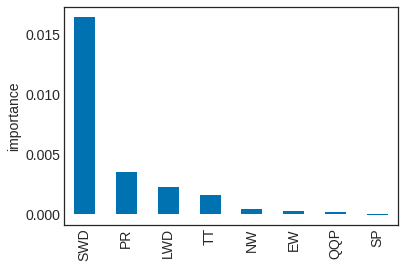

In [ ]:
feat_imp_diz = permut_features_importance(error, columns_name, full_input, full_target, mask, trainingParam, net_UPRCM, device, model)

feat_imp_mean, feat_imp_std = feat_imp_diz
feat_imp_mean = pd.Series(feat_imp_mean)
feat_imp_std = pd.Series(feat_imp_std)

order = feat_imp_mean.sort_values(ascending=False).index
feat_imp_mean = feat_imp_mean[order]
feat_imp_std = feat_imp_std[order]

feat_imp_mean.plot.bar(yerr=feat_imp_std)
plt.ylabel('importance')

In [ ]:
colors = iter([plt.cm.Pastel1(i) for i in range(20)])
next(colors)

(0.984313725490196, 0.7058823529411765, 0.6823529411764706, 1.0)

In [ ]:
cmap = plt.cm.get_cmap('Pastel1', 5)    # PiYG

for i in range(cmap.N):
    rgba = cmap(i)
    # rgb2hex accepts rgb or rgba
    print(matplotlib.colors.rgb2hex(rgba))

#fbb4ae
#ccebc5
#fed9a6
#e5d8bd
#f2f2f2


## Training on GCM:

In [ ]:
REGION = "Larsen"
LOSS_ = "NRMSE"
TYPENET = "Attention"

# Make target
targets, target_times = target_maker(target_dataset, region=REGION, resize=False)

# Full target to model
full_target = np.concatenate(targets, axis=0)
target_time = np.concatenate(target_times, axis=0)
target_lon = target_dataset["x"]
target_lat = target_dataset["y"]

# Create mask over ice/land
mask = createMask(full_target[0, :, :], onechannel=True)

# GCM input
i1D_GCM, i2D_GCM, i1D_ns, i2D_ns, VAR_LIST = make_inputs(
    GCMLike=GCMLike,
    GCM=GCM,
    size_input_domain=SIZE_INPUT_DOMAIN,
    Region=REGION,
    dropvarGCM=None,
    dropvarRCM=["RF", "SF", "TTP"],
)
full_input_GCM = [np.concatenate([i2D_GCM], axis=0), np.concatenate([i1D_GCM], axis=0)]
REGIONS = [REGION]

# Parameters used in training
trainingParam = dict(
    num_epochs=NUM_EPOCHS,
    batch_size=BATCH_SIZE,
    lr=LR,
    seed=SEED,
    amp=AMP,
    test_percent=TEST_PERCENT,
    val_percent=VAL_PERCENT,
    loss_=LOSS_,
    typeNet=TYPENET,
)

# GCM: Load datasets and U-Net
print('Creating GCM dataset:\n------------------')
train_set_GCM, test_set_GCM, net_GCM = trainFlow(
    full_input_GCM,
    full_target,
    mask,
    region=REGION,
    train=False,
    randomSplit=False,
    log_ = False,
    **trainingParam,
)

# Load saved model
today = str(date.today())
model = f"MODEL_{today}_{REGION}_{NUM_EPOCHS}_{BATCH_SIZE}_{TYPENET}_{LOSS_}.pth"
downloadModel = True
if downloadModel:
    # Download from google drive
    if TYPENET == "Attention":
        print("Loading from attention model")
        idModel = '12AZ5mB801ql8g8ovAC8uv1yHE5v6bRxo'
    downloaded = Googledrive.CreateFile({"id": idModel})
    downloaded.GetContentFile(model)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Predictions on GCM
print('Predicting on GCM dataset:\n------------------')
(preds_Larsen_NRMSE_GCM_train,
    x_Larsen_NRMSE_GCM_train,
    z_Larsen_NRMSE_GCM_train,
    true_smb_Larsen_NRMSE_GCM_train,
    r_Larsen_NRMSE_GCM_train,
       loss_mse_train, 
      loss_nrmse_train, 
      loss_rmse_train
) = predict(net_GCM, device, test_set_GCM, model, log_ = False)

Variables: ['EW', 'LWD', 'NW', 'PR', 'QQP', 'SP', 'SWD', 'TT']
Variables: ['EW', 'LWD', 'NW', 'PR', 'QQP', 'SP', 'SWD', 'TT']
Creating GCM dataset:
------------------
Loading from attention model
Predicting on GCM dataset:
------------------


### Geoplots:

/usr/local/lib/python3.7/dist-packages/cartopy/crs.py:245: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  if len(multi_line_string) > 1:
/usr/local/lib/python3.7/dist-packages/cartopy/crs.py:297: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  for line in multi_line_string:
/usr/local/lib/python3.7/dist-packages/cartopy/crs.py:364: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  if len(p_mline) > 0:


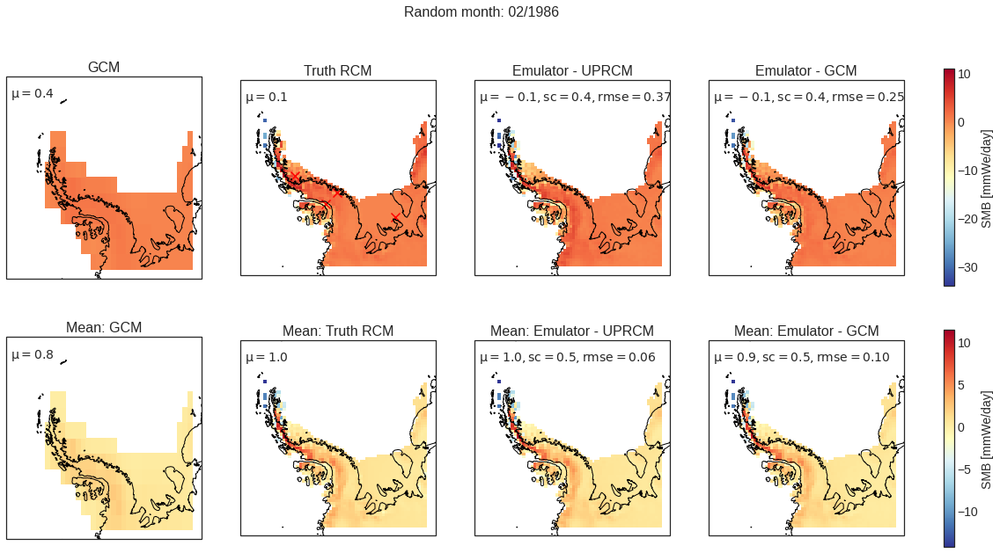

In [ ]:
points_RCM = (
    {"x": 16, "y": 32},
    {"x": 27, "y": 22},
    {"x": 31, "y": 26},
    {"x": 52, "y": 17},
)
plotRandomPrediction(
    preds_Larsen_NRMSE,
    preds_Larsen_NRMSE_GCM_train,
    true_smb_Larsen_NRMSE_GCM,
    r_Larsen_NRMSE_GCM,
    GCMLike,
    target_dataset,
    points_RCM,
    figsize = (20, 10)
)

### Time series:

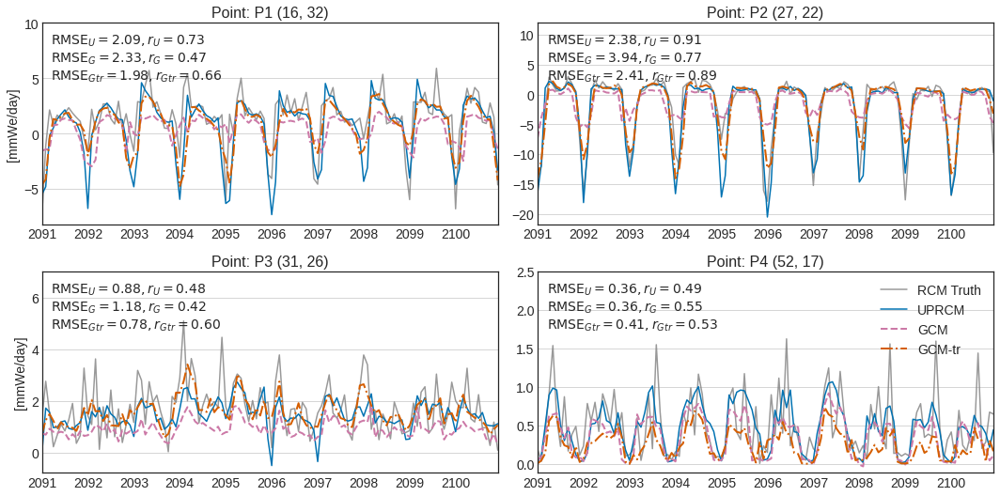

In [ ]:
from prediction import *
points_RCM = (
    {"x": 16, "y": 32},
    {"x": 27, "y": 22},
    {"x": 31, "y": 26},
    {"x": 52, "y": 17},
)

metrics = plotTimeseries3Models(
    preds_Larsen_NRMSE,
    preds_Larsen_NRMSE_GCM,
    preds_Larsen_NRMSE_GCM_train,
    true_smb_Larsen_NRMSE,
    train_set_GCM,
    target_dataset,
    points_RCM,
    REGION,
    len(points_RCM),
    figsize=(15, 11),
    labels = ['UPRCM', 'GCM','GCM-tr']
)

### Metrics:

/usr/local/lib/python3.7/dist-packages/numpy/lib/function_base.py:2691: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.7/dist-packages/numpy/lib/function_base.py:2692: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]
/content/metrics.py:40: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  predictions = torch.tensor(preds).clone().detach()
/content/metrics.py:41: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  target = torch.tensor(true_smb).clone().detach()
/usr/local/lib/python3.7/dist-packages/numpy/lib/function_base.py:2691: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]


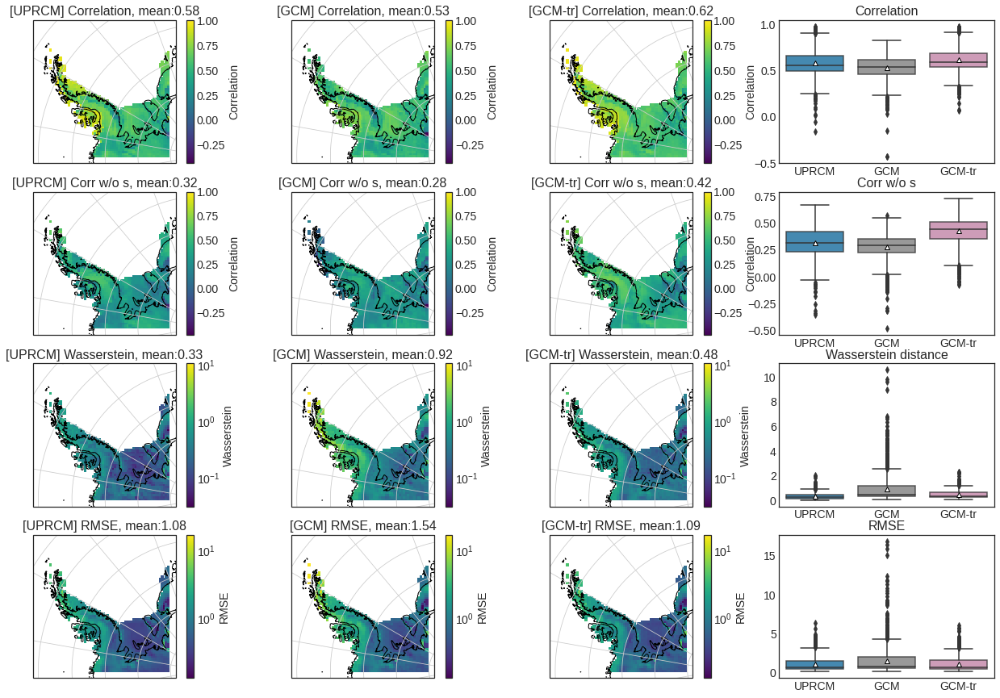

In [ ]:
from metrics import *
from prediction_3models import *

PearsonCorr, Wasserstein, ROV, MSE, RMSE, NRMSE, PearsonCorrAn, ROD = calculateMetrics(
    preds_Larsen_NRMSE,
    true_smb_Larsen_NRMSE,
    target_dataset,
    train_set_UPRCM,
    REGION,
    ignoreSea=True,
)

(
    PearsonCorr_GCM_train,
    Wasserstein_GCM_train,
    ROV_GCM_train,
    MSE_GCM_train,
    RMSE_GCM_train,
    NRMSE_GCM_train,
    PearsonCorrAn_GCM_train,
    ROD_GCM_train,
) = calculateMetrics(
    preds_Larsen_NRMSE_GCM_train,
    true_smb_Larsen_NRMSE,
    target_dataset,
    train_set_GCM,
    REGION,
    ignoreSea=True,
)

(
    PearsonCorr_GCM,
    Wasserstein_GCM,
    ROV_GCM,
    MSE_GCM,
    RMSE_GCM,
    NRMSE_GCM,
    PearsonCorrAn_GCM,
    ROD_GCM,
) = calculateMetrics(
    preds_Larsen_NRMSE_GCM,
    true_smb_Larsen_NRMSE,
    target_dataset,
    train_set_GCM,
    REGION,
    ignoreSea=True,
)
CompareMetrics3Models(
    [PearsonCorr, PearsonCorr_GCM, PearsonCorr_GCM_train],
    [Wasserstein, Wasserstein_GCM, Wasserstein_GCM_train],
    [RMSE, RMSE_GCM, RMSE_GCM_train],
    [PearsonCorrAn, PearsonCorrAn_GCM, PearsonCorrAn_GCM_train],
    target_dataset,
    region="Larsen",
    models=["UPRCM","GCM", "GCM-tr"],
    figsize=(22, 15),
)


### Annual SMB:

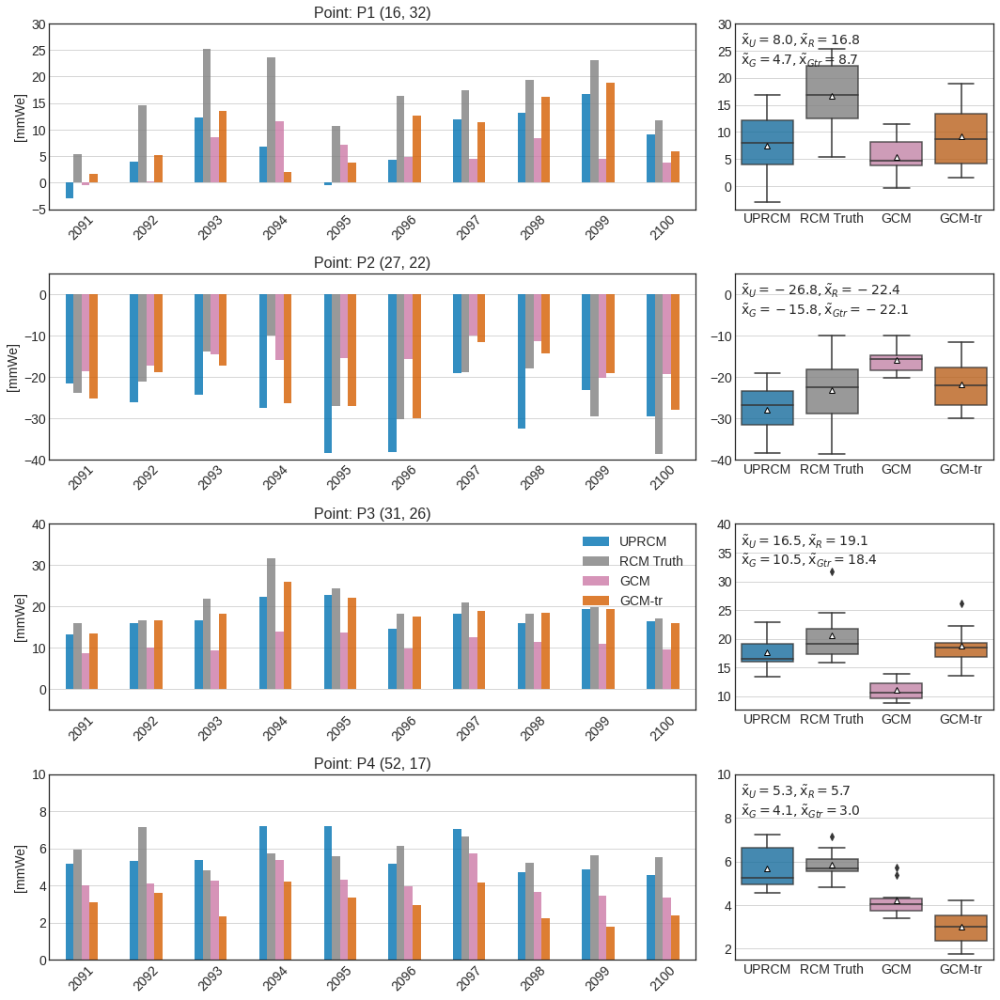

In [ ]:
from prediction_3models import *
metrics = annualSMB3Models(
    preds_Larsen_NRMSE,
    true_smb_Larsen_NRMSE,
    train_set_UPRCM,
    target_dataset,
    points_RCM,
    preds_Larsen_NRMSE_GCM,
    preds_Larsen_NRMSE_GCM_train,
    figsize = (15, 15),
    labels = ['UPRCM', 'GCM','GCM-tr']
)

# Larsen - Attention - NRMSE:

In [ ]:
# variables in GCMLike
all_vars_RCM = sorted(list(GCMLike.data_vars))
all_vars_GCM = sorted(list(GCM.data_vars))

# variables we want to train on:
vars =['PR', 'SP', 'LWD','SWD','TT', 'EW', 'NW', 'QQP']

print('Variables in GCMLike:',all_vars_RCM)
print('Variables in GCM:', sorted(list(GCM.data_vars)))
print('Variables to drop in GCMLike:', Diff(all_vars_RCM, vars))
print('Variables to drop in GCM:', Diff(all_vars_GCM, vars))

Variables in GCMLike: ['EW', 'LWD', 'NW', 'PR', 'QQP', 'RF', 'SF', 'SMB', 'SP', 'SWD', 'TT', 'TTP']
Variables in GCM: ['EW', 'LWD', 'NW', 'PR', 'QQP', 'SP', 'SWD', 'TT']
Variables to drop in GCMLike: ['SF', 'TTP', 'RF', 'SMB']
Variables to drop in GCM: []


Variables: ['EW', 'LWD', 'NW', 'PR', 'QQP', 'SP', 'SWD', 'TT']
Return input of GCMLike
Variables: ['EW', 'LWD', 'NW', 'PR', 'QQP', 'SP', 'SWD', 'TT']
Return input of GCMLike
Shapes of targets and inputs:
---------------------------
Target: (1452, 64, 64, 1)
Input 2D: (1452, 32, 32, 8)
Input 1D: (1452, 1, 1, 18)


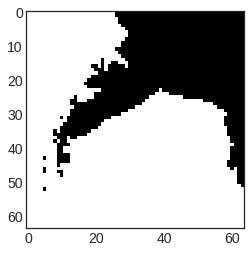

In [ ]:
REGION = "Larsen"
LOSS_ = "NRMSE"
TYPENET = "Attention"
# Make target
targets, target_times = target_maker(target_dataset, region=REGION, resize=False)
# Full target to model
full_target = np.concatenate(targets, axis=0)
target_time = np.concatenate(target_times, axis=0)
target_lon = target_dataset["x"]
target_lat = target_dataset["y"]

i1D, i2D, i1D_ns, i2D_ns, VAR_LIST = make_inputs(
    GCMLike = GCMLike, GCM = None, size_input_domain=SIZE_INPUT_DOMAIN, Region=REGION,
    dropvarGCM = None, dropvarRCM = ['RF', 'SF', 'TTP']
)
full_input = [np.concatenate([i2D], axis=0), np.concatenate([i1D], axis=0)]

full_input_ns = [
    np.concatenate([i2D_ns], axis=0),
    np.concatenate([i1D_ns], axis=0),
]

REGIONS = [REGION]

mask = createMask(full_target[0,:,:], onechannel = True)
plt.imshow(mask)

print("Shapes of targets and inputs:\n---------------------------")
print("Target:", full_target.shape)
print("Input 2D:", full_input[0].shape)
print("Input 1D:", full_input[1].shape)

In [ ]:
# Parameters used in training
TYPENET = "Attention"

trainingParam = dict(
    num_epochs=NUM_EPOCHS,
    batch_size=BATCH_SIZE,
    lr=LR,
    seed=SEED,
    amp=AMP,
    test_percent=TEST_PERCENT,
    val_percent=VAL_PERCENT,
    loss_=LOSS_,
    typeNet=TYPENET,
)
# Load datasets and U-Net
train_set, test_set, net = trainFlow(
    full_input,
    full_target,
    mask,
    region=REGION,
    train=False,
    randomSplit=False,
    **trainingParam,
)

# Load saved model
today = str(date.today())
# today = '2022-05-13'

model = f"MODEL_{today}_{REGION}_{NUM_EPOCHS}_{BATCH_SIZE}_{TYPENET}_{LOSS_}.pth"
downloadModel = True
if downloadModel:
    # downloadFileFromGC(pathModel, "", model)
    # Download from google drive
    if TYPENET == "Attention":
        print("Loading from attention model")
        #bestModelId = "1-XnM-cYK4xi7ozjSDggJNtl5egbc-IiY" # best model
        #idModel = '1-ulYWFvvScuxhonb9pT637uAsqIzkpff'
        idModel = '1--bsNjbXxdmB_r8dk3_r9Eu3jWbDXMIB'
    downloaded = Googledrive.CreateFile({"id": idModel})
    downloaded.GetContentFile(model)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# make predictions
(preds_Larsen_NRMSE,
    x_Larsen_NRMSE,
    z_Larsen_NRMSE,
    true_smb_Larsen_NRMSE,
    r_Larsen_NRMSE,
) = predict(net, device, test_set, model)

INFO: Using device cpu
INFO: Attention SmAt_UNet model
INFO: Network:
	8 input channels X
	18 input channels Z
	Transposed conv upscaling
INFO: Test set size: 120
Train set size: 1332



X shape: torch.Size([1452, 8, 32, 32])
Loading from attention model


INFO: Loading saved model MODEL_2022-06-09_Larsen_100_32_Attention_NRMSE.pth
INFO: Using device cpu
INFO: Saved model loaded!


### Points and timeseries:

'02/1986'

/usr/local/lib/python3.7/dist-packages/cartopy/crs.py:228: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  if len(multi_line_string) > 1:
/usr/local/lib/python3.7/dist-packages/cartopy/crs.py:280: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  for line in multi_line_string:
/usr/local/lib/python3.7/dist-packages/cartopy/crs.py:347: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  if len(p_mline) > 0:


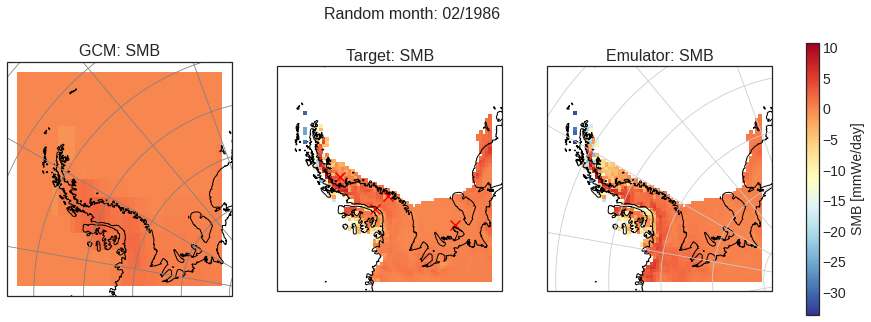

In [ ]:
"""
points_RCM = (
    {"x": 16, "y": 32},
    {"x": 27, "y": 22},
    {"x": 29, "y": 24},
    {"x": 31, "y": 26},
    {"x": 32, "y": 16},
    {"x": 52, "y": 16},
)"""

points_RCM = (
    {"x": 16, "y": 32},
    {"x": 27, "y": 22},
    {"x": 31, "y": 26},
    {"x": 52, "y": 17},
)

plotRandomPrediction(
    preds_Larsen_NRMSE,
    x_Larsen_NRMSE,
    z_Larsen_NRMSE,
    true_smb_Larsen_NRMSE,
    r_Larsen_NRMSE,
    GCMLike,
    VAR_LIST,
    target_dataset,
    points_RCM,
    regions=[REGION],
    figsize = (15, 5)
)

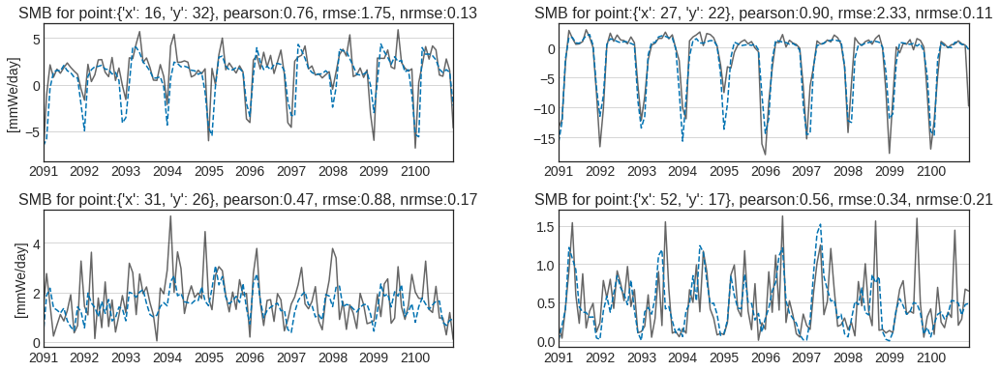

In [ ]:
plotTimeseries(
    preds_Larsen_NRMSE,
    true_smb_Larsen_NRMSE,
    train_set,
    target_dataset,
    points_RCM,
    REGION,
    len(points_RCM),
    rollingMean = None, 
    figsize=(15, 8)
)

### Annual SMB values:

[{'nrmse': 0.3485117495697649,
  'pearson': 0.8456787844050899,
  'point': {'x': 16, 'y': 32},
  'rmse': 6.9421854},
 {'nrmse': 0.24731796529241398,
  'pearson': 0.6007772268138646,
  'point': {'x': 27, 'y': 22},
  'rmse': 7.0606723},
 {'nrmse': 0.22638242531319866,
  'pearson': 0.8311945758786589,
  'point': {'x': 31, 'y': 26},
  'rmse': 3.6049364},
 {'nrmse': 0.3908833211843336,
  'pearson': 0.4830601038363316,
  'point': {'x': 52, 'y': 17},
  'rmse': 0.9084911}]

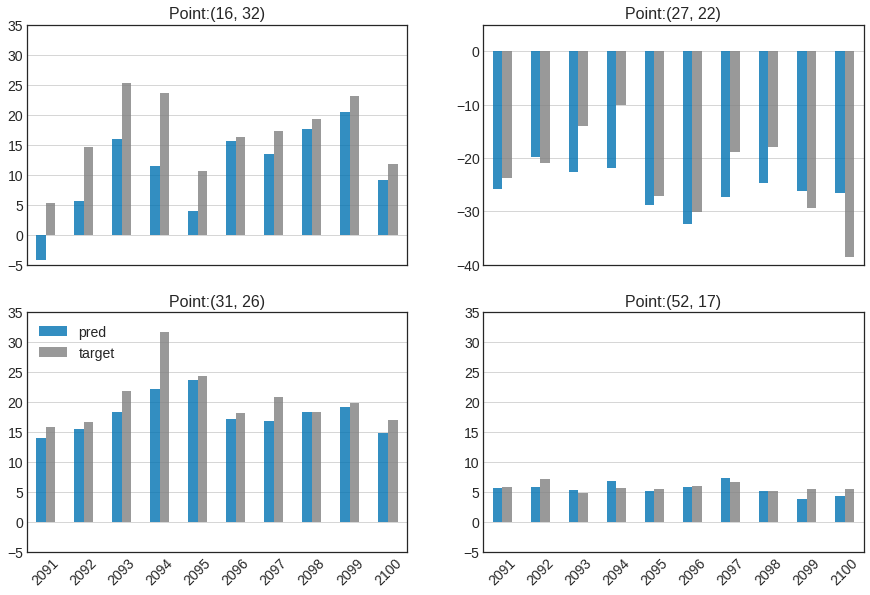

In [ ]:
metrics = annualSMB(preds_Larsen_NRMSE, true_smb_Larsen_NRMSE, train_set, target_dataset, points_RCM, figsize=(15, 15))
metrics

### Multiple predictions:

/usr/local/lib/python3.7/dist-packages/cartopy/crs.py:228: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  if len(multi_line_string) > 1:
/usr/local/lib/python3.7/dist-packages/cartopy/crs.py:280: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  for line in multi_line_string:
/usr/local/lib/python3.7/dist-packages/cartopy/crs.py:347: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  if len(p_mline) > 0:


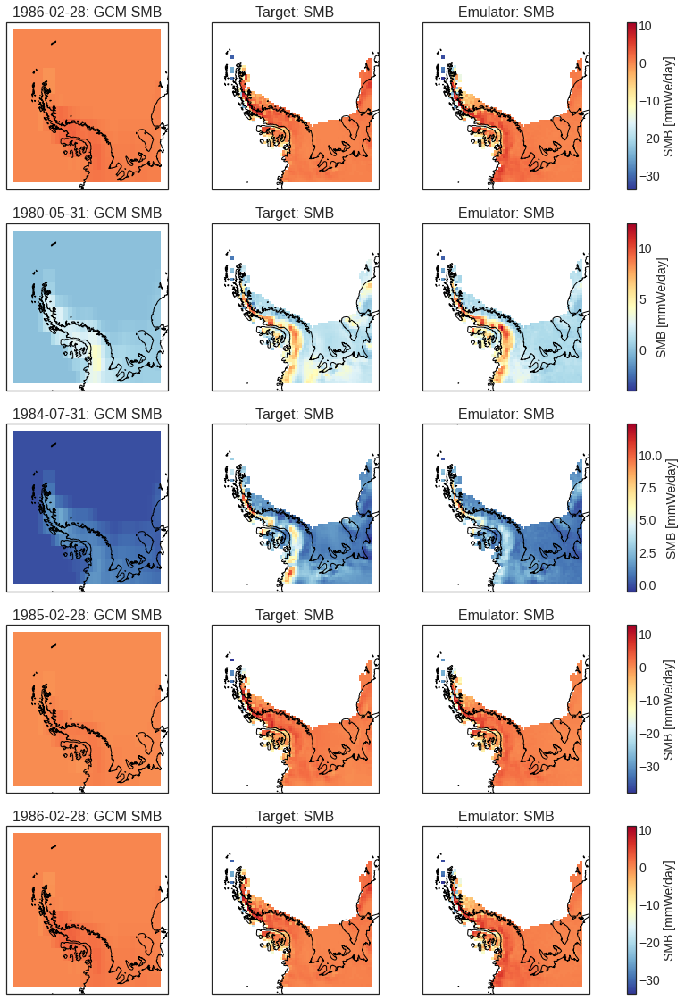

In [ ]:
plotMultiplePredictions(
    preds_Larsen_NRMSE,
    x_Larsen_NRMSE,
    z_Larsen_NRMSE,
    true_smb_Larsen_NRMSE,
    r_Larsen_NRMSE,
    GCMLike,
    VAR_LIST,
    target_dataset,
    points_RCM,
    regions=[REGION],
    figsize = (15, 20), N = 5)

### Metrics:

/usr/local/lib/python3.7/dist-packages/numpy/lib/function_base.py:2691: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.7/dist-packages/numpy/lib/function_base.py:2692: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]
/content/metrics.py:39: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  predictions = torch.tensor(preds).clone().detach()
/content/metrics.py:40: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  target = torch.tensor(true_smb).clone().detach()
/usr/local/lib/python3.7/dist-packages/numpy/lib/function_base.py:2691: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]


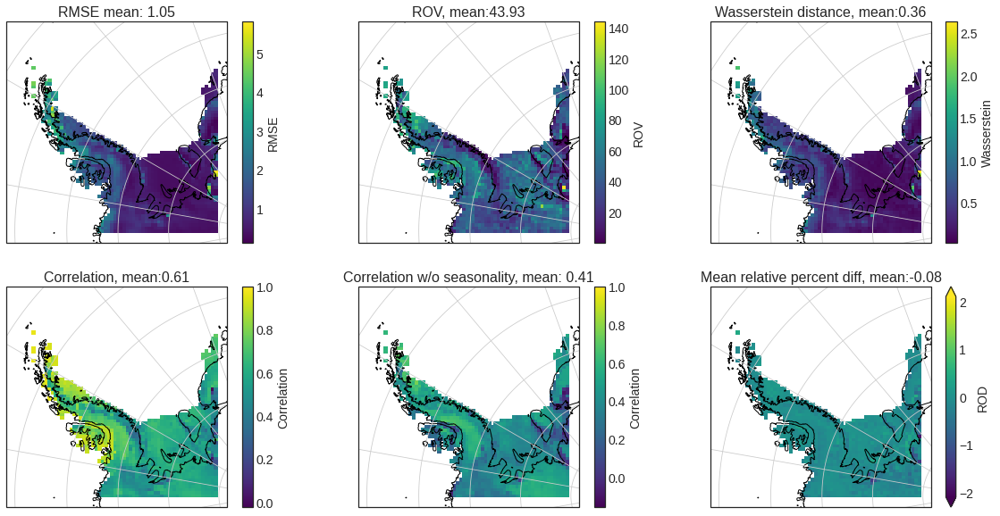

In [ ]:
ignoreSea = True
PearsonCorr, Wasserstein, ROV, MSE, RMSE, NRMSE, PearsonCorrAn, ROD = calculateMetrics(
    preds_Larsen_NRMSE,
    true_smb_Larsen_NRMSE,
    target_dataset,
    train_set,
    REGION,
    ignoreSea,
)
plotMetrics(
    PearsonCorr,
    Wasserstein,
    ROV,
    RMSE,
    PearsonCorrAn,
    ROD,
    target_dataset,
    REGION,
    today,
    trainingParam["num_epochs"],
    trainingParam["batch_size"],
    cmap = 'viridis', 
    figsize = (20, 10)
)
#plt.suptitle("Emualtor")

### Ridge:

Text(0.5, 0.98, '')

/usr/local/lib/python3.7/dist-packages/cartopy/crs.py:228: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  if len(multi_line_string) > 1:
/usr/local/lib/python3.7/dist-packages/cartopy/crs.py:280: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  for line in multi_line_string:
/usr/local/lib/python3.7/dist-packages/cartopy/crs.py:347: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  if len(p_mline) > 0:


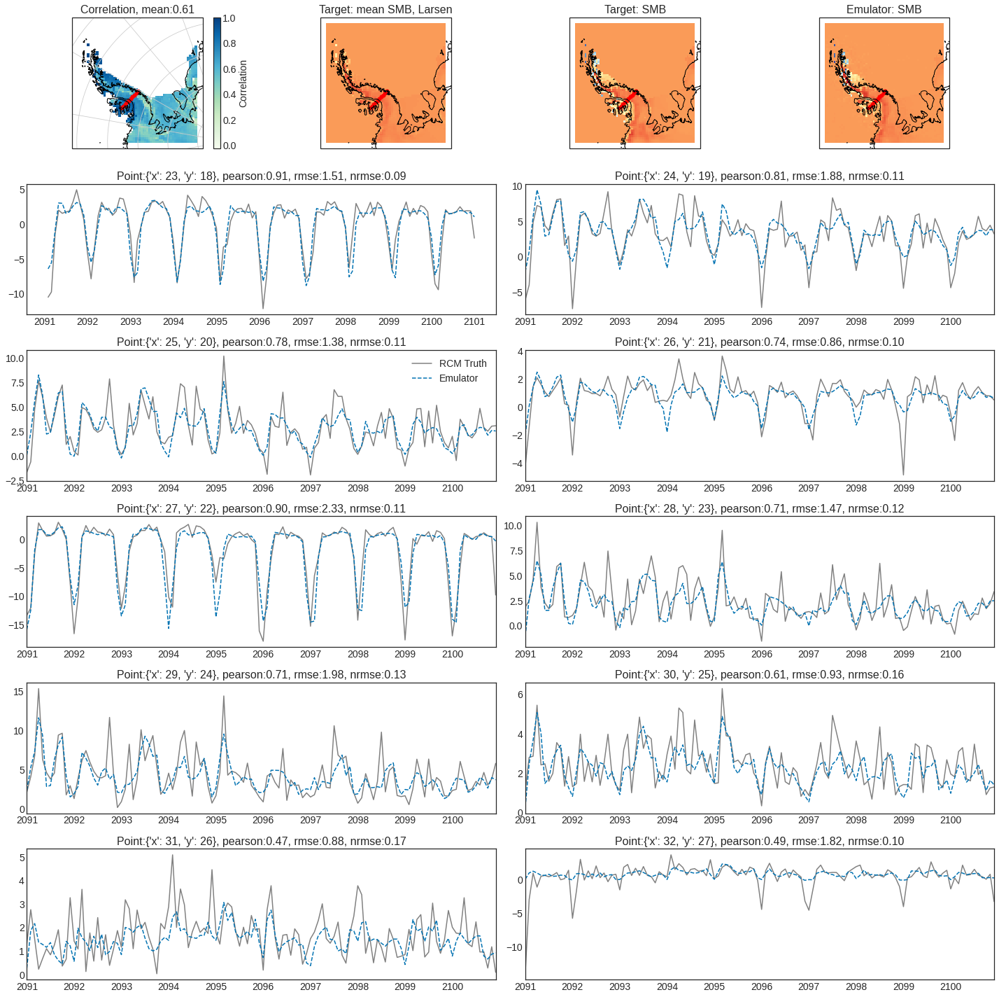

In [ ]:
from metrics import *
# plot points
coordinates = (
    {"x": 23, "y": 18},
    {"x": 24, "y": 19},
    {"x": 25, "y": 20},
    {"x": 26, "y": 21},
    {"x": 27, "y": 22},
    {"x": 28, "y": 23},
    {"x": 29, "y": 24},
    {"x": 30, "y": 25},
    {"x": 31, "y": 26},
    {"x": 32, "y": 27}
)

plotRidge(
    coordinates,
    PearsonCorr,
    true_smb_Larsen_NRMSE,
    preds_Larsen_NRMSE,
    target_dataset,
    GCMLike,
    train_set,
    REGION,
    N = len(coordinates),
    marker = '.',
    figsize = (20, 20),
)
nameFig = "{}_ts_{}_{}_{}_{}.png".format(
    today, REGION, LOSS_, trainingParam["num_epochs"], trainingParam["batch_size"]
)
#plt.suptitle('Three time series at diffrent coordinates, loss: MSE')
plt.suptitle('')

### Plot target:

In [ ]:
#randTime = rn.randint(0, dsRCM.dims['time'] - 1)
randTime = 20
dt = pd.to_datetime([GCMLike.time.isel(time=len(train_set)+randTime).values])
time = str(dt.date[0])

Text(0.5, 1.0, '')

/usr/local/lib/python3.7/dist-packages/cartopy/crs.py:228: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  if len(multi_line_string) > 1:
/usr/local/lib/python3.7/dist-packages/cartopy/crs.py:280: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  for line in multi_line_string:
/usr/local/lib/python3.7/dist-packages/cartopy/crs.py:347: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  if len(p_mline) > 0:


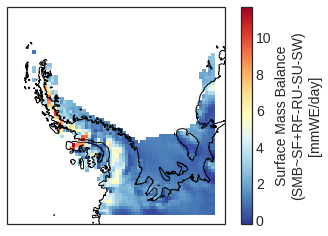

In [ ]:
dsRCM = createLowerTarget(target_dataset, region='Larsen', Nx=64, Ny=64, print_=False)
ax = plt.subplot(1, 1, 1, projection=ccrs.SouthPolarStereo())

sampletarget_ = true_smb_Larsen_NRMSE[randTime]
# apply mask to show only values on ice/land
masktarget = np.expand_dims(createMask(sampletarget_, onechannel=True), 2)
sampletarget_ = masktarget * sampletarget_
sampletarget_[sampletarget_ == 0] = "nan"
im = plotTarget(target_dataset, sampletarget_, ax, np.nanmin(sampletarget_), np.nanmax(sampletarget_), region='Larsen', colorbar = True)
ax.set_title(f"Target: SMB, {time}")
ax.set_title('')

In [ ]:
dsGCM

<xarray.Dataset>
Dimensions:      (time: 1452, y: 25, x: 48)
Coordinates:
    spatial_ref  int64 0
  * x            (x) float32 -2.992e+06 -2.924e+06 ... 1.36e+05 2.04e+05
  * y            (y) float32 -2.472e+06 -2.266e+06 ... 2.266e+06 2.472e+06
  * time         (time) datetime64[ns] 1980-01-31 1980-02-29 ... 2100-12-31
Data variables:
    SF           (time, y, x) float32 4.954e-06 1.27e-05 ... 0.4367 0.458
    RF           (time, y, x) float32 0.1348 0.2703 0.4712 ... 0.02162 0.02865
    SP           (time, y, x) float32 1.005e+03 1.005e+03 ... 982.2 982.0
    LWD          (time, y, x) float32 267.7 277.8 288.8 ... 237.8 238.9 239.5
    SWD          (time, y, x) float32 279.2 257.5 232.0 ... 327.5 323.4 319.9
    TT           (time, y, x) float32 6.394 6.191 5.858 ... -3.452 -3.29 -3.129
    SMB          (time, y, x) float32 0.0 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0
    TTP          (time, y, x) float64 1.661 1.556 1.387 ... -3.979 -3.906 -3.855
    QQP          (time, y, x) float64 4.471 4.451 4.413 ... 2.652 2.654 2.657
    PR           (time, y, x) float32 0.1349 0.2703 0.4712 ... 0.4583 0.4867
    NW           (time, y, x) float64 -0.5912 -0.6433 -0.6483 ... 0.7992 0.9585
    EW           (time, y, x) float64 5.186 5.029 4.758 ... 1.494 1.318 1.156
Attributes:
    crs:      3031

/usr/local/lib/python3.7/dist-packages/cartopy/crs.py:228: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  if len(multi_line_string) > 1:
/usr/local/lib/python3.7/dist-packages/cartopy/crs.py:280: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  for line in multi_line_string:
/usr/local/lib/python3.7/dist-packages/cartopy/crs.py:347: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  if len(p_mline) > 0:
/usr/local/lib/python3.7/dist-packages/cartopy/crs.py:385: ShapelyDeprecationWarning: Iteration over multi-pa

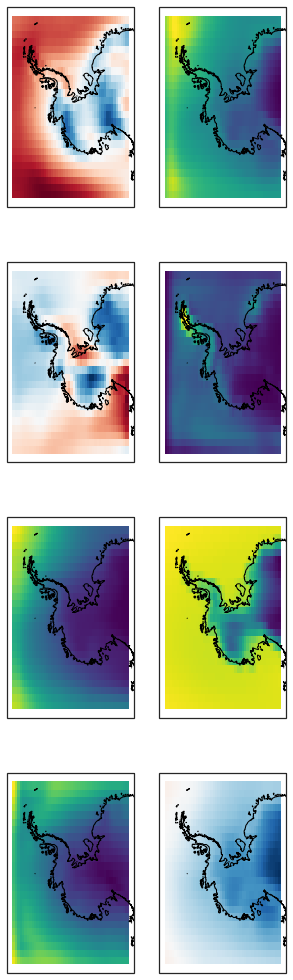

In [ ]:
dsGCM = createLowerInput(GCMLike, region="Larsen", Nx=48, Ny=25, print_=False)
#dsGCM = dsGCM.where(dsGCM.y > 0, drop=True)
plotAllVar(dsGCM.drop(['RF', 'SF', 'TTP', 'SMB']), randTime = randTime, m = 4, n = 2, 
           figsize = (5, 18), withlabels = False)

# Larsen - Attention - NRMSE GCM:

In [ ]:
REGION = "Larsen"
LOSS_ = "NRMSE"
TYPENET = "Attention"
# Make target
targets, target_times = target_maker(target_dataset, region=REGION, resize=False)
# Full target to model
full_target = np.concatenate(targets, axis=0)
target_time = np.concatenate(target_times, axis=0)
target_lon = target_dataset["x"]
target_lat = target_dataset["y"]

# Make input

i1D_GCM, i2D_GCM, i1D_ns, i2D_ns, VAR_LIST = make_inputs(
    GCMLike = GCMLike, GCM = GCM, size_input_domain=SIZE_INPUT_DOMAIN, Region=REGION,
    dropvarGCM = None, dropvarRCM = ['RF', 'SF', 'TTP'])
full_input_GCM = [np.concatenate([i2D_GCM], axis=0), np.concatenate([i1D_GCM], axis=0)]

Variables: ['EW', 'LWD', 'NW', 'PR', 'QQP', 'SP', 'SWD', 'TT']
Return input of GCM
Variables: ['EW', 'LWD', 'NW', 'PR', 'QQP', 'SP', 'SWD', 'TT']
Return input of GCM


In [ ]:
# Parameters used in training
trainingParam = dict(
    num_epochs=NUM_EPOCHS,
    batch_size=BATCH_SIZE,
    lr=LR,
    seed=SEED,
    amp=AMP,
    test_percent=TEST_PERCENT,
    val_percent=VAL_PERCENT,
    loss_=LOSS_,
    typeNet=TYPENET,
)

# Load datasets and U-Net
train_set, test_set, net = trainFlow(
    full_input_GCM,
    full_target,
    mask,
    region=REGION,
    train=False,
    randomSplit=False,
    **trainingParam,
)

# Load saved model
today = str(date.today())

model = f"MODEL_{today}_{REGION}_{NUM_EPOCHS}_{BATCH_SIZE}_{TYPENET}_{LOSS_}.pth"
downloadModel = True
if downloadModel:
    # Download from google drive
    if TYPENET == "Attention":
        print("Loading from attention model")
        idModel = '1--bsNjbXxdmB_r8dk3_r9Eu3jWbDXMIB'
    downloaded = Googledrive.CreateFile({"id": idModel})
    downloaded.GetContentFile(model)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# make predictions
(preds_Larsen_NRMSE_GCM,
    x_Larsen_NRMSE_GCM,
    z_Larsen_NRMSE_GCM,
    true_smb_Larsen_NRMSE_GCM,
    r_Larsen_NRMSE_GCM,
) = predict(net, device, test_set, model)

INFO: Using device cpu
INFO: Attention SmAt_UNet model
INFO: Network:
	8 input channels X
	18 input channels Z
	Transposed conv upscaling
INFO: Test set size: 120
Train set size: 1332



X shape: torch.Size([1452, 8, 32, 32])
Loading from attention model


INFO: Loading saved model MODEL_2022-06-09_Larsen_100_32_Attention_NRMSE.pth
INFO: Using device cpu
INFO: Saved model loaded!


### Points and timeseries:

'02/1986'

/usr/local/lib/python3.7/dist-packages/cartopy/crs.py:228: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  if len(multi_line_string) > 1:
/usr/local/lib/python3.7/dist-packages/cartopy/crs.py:280: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  for line in multi_line_string:
/usr/local/lib/python3.7/dist-packages/cartopy/crs.py:347: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  if len(p_mline) > 0:


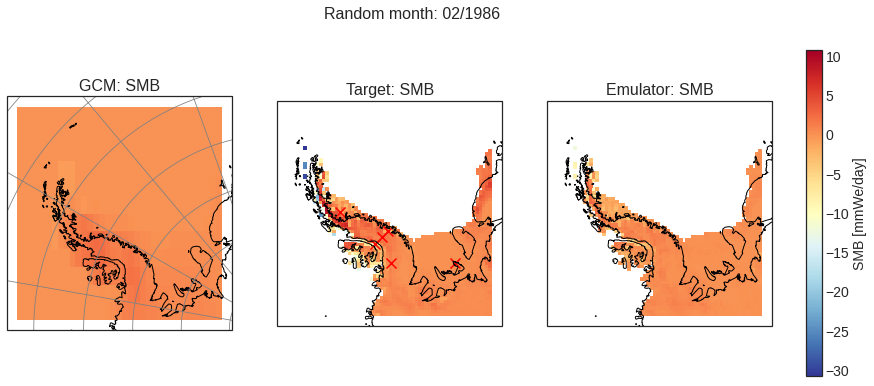

In [ ]:
points_RCM = (
    {"x": 16, "y": 32},
    {"x": 27, "y": 22},
    {"x": 29, "y": 24},
    {"x": 31, "y": 26},
    {"x": 32, "y": 16},
    {"x": 52, "y": 16},
)

plotRandomPrediction(
    preds_Larsen_NRMSE_GCM,
    x_Larsen_NRMSE_GCM,
    z_Larsen_NRMSE_GCM,
    true_smb_Larsen_NRMSE_GCM,
    r_Larsen_NRMSE_GCM,
    GCMLike,
    VAR_LIST,
    target_dataset,
    points_RCM,
    regions=[REGION],
    figsize = (15, 6)
)

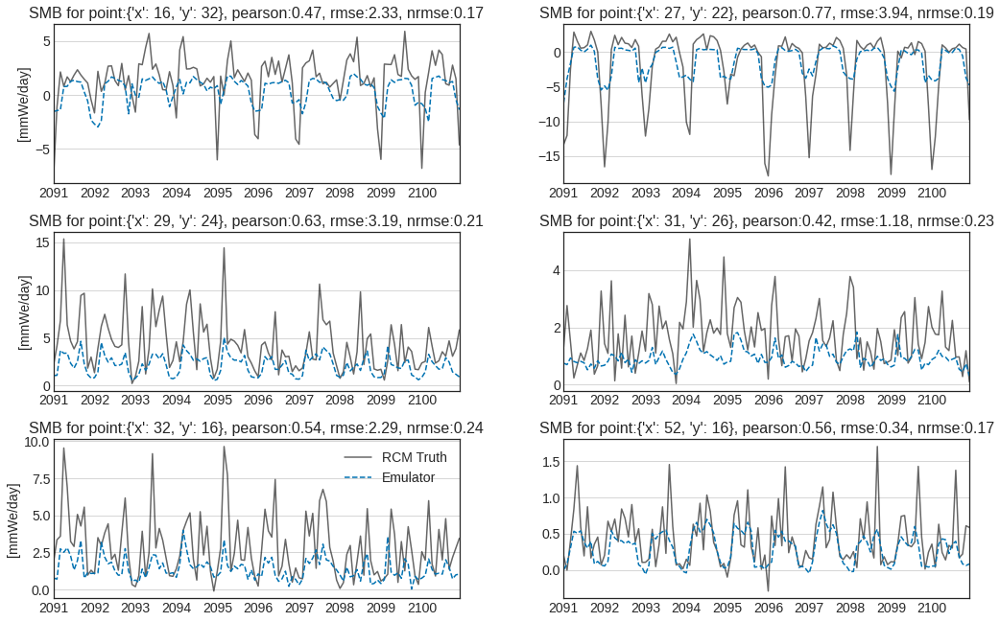

In [ ]:
plotTimeseries(
    preds_Larsen_NRMSE_GCM,
    true_smb_Larsen_NRMSE_GCM,
    train_set,
    target_dataset,
    points_RCM,
    REGION,
    len(points_RCM),
    rollingMean = None,
    figsize = (15, 12)
)

### Annual SMB predictions:

[{'nrmse': 0.6142072725992251,
  'pearson': 0.6836486086265358,
  'point': {'x': 16, 'y': 32},
  'rmse': 12.234712},
 {'nrmse': 0.3510645678925617,
  'pearson': 0.5418634417058961,
  'point': {'x': 27, 'y': 22},
  'rmse': 10.022531},
 {'nrmse': 0.7988672807475731,
  'pearson': 0.746054299255043,
  'point': {'x': 29, 'y': 24},
  'rmse': 27.905352},
 {'nrmse': 0.6310833112892854,
  'pearson': 0.7965512348161291,
  'point': {'x': 31, 'y': 26},
  'rmse': 10.049434},
 {'nrmse': 0.6862870086183043,
  'pearson': 0.738015742854405,
  'point': {'x': 32, 'y': 16},
  'rmse': 18.052408},
 {'nrmse': 0.9532847083169284,
  'pearson': 0.24155051536970376,
  'point': {'x': 52, 'y': 16},
  'rmse': 1.831084}]

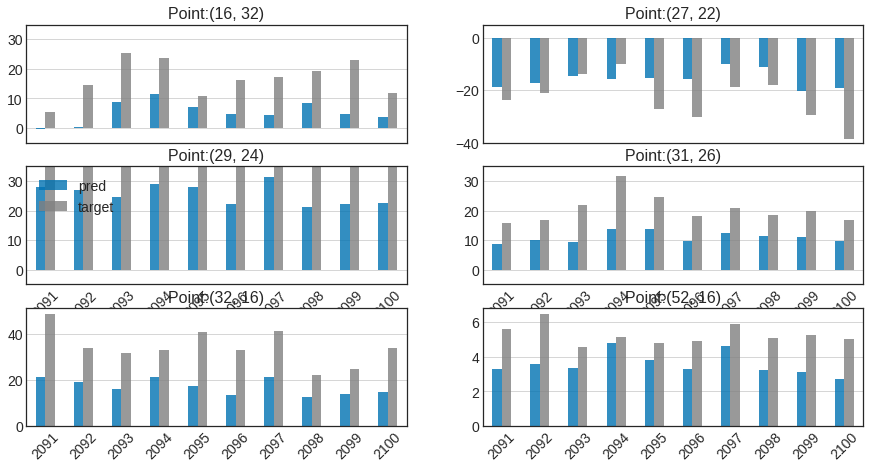

In [ ]:
annualSMB(preds_Larsen_NRMSE_GCM, true_smb_Larsen_NRMSE_GCM, train_set, target_dataset, points_RCM)

### Predictions

/usr/local/lib/python3.7/dist-packages/cartopy/crs.py:228: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  if len(multi_line_string) > 1:
/usr/local/lib/python3.7/dist-packages/cartopy/crs.py:280: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  for line in multi_line_string:
/usr/local/lib/python3.7/dist-packages/cartopy/crs.py:347: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  if len(p_mline) > 0:


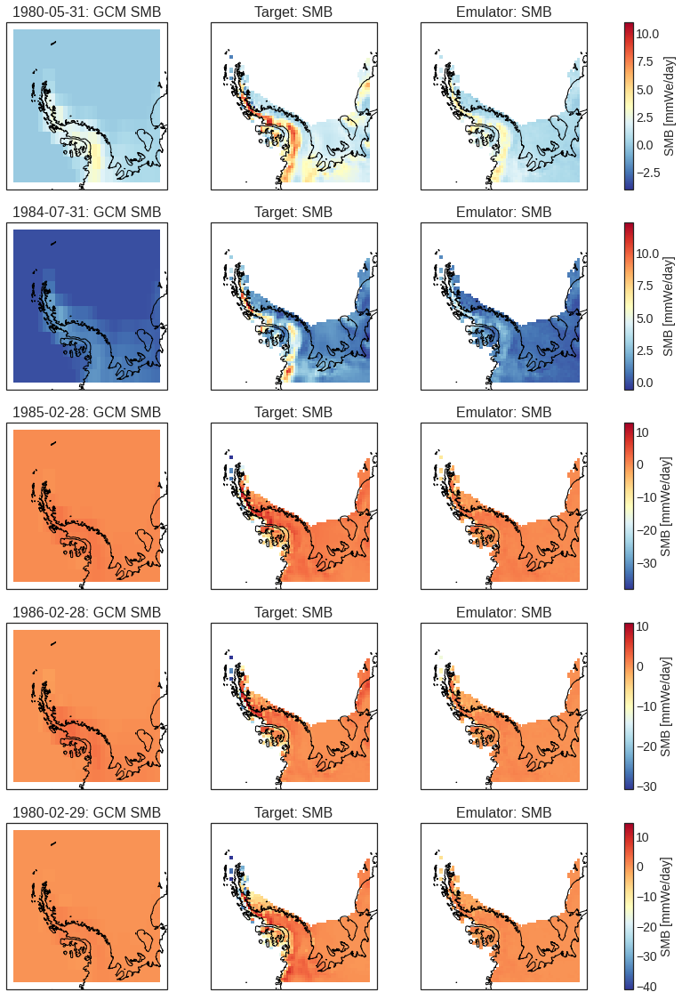

In [ ]:
plotMultiplePredictions(
    preds_Larsen_NRMSE_GCM,
    x_Larsen_NRMSE_GCM,
    z_Larsen_NRMSE_GCM,
    true_smb_Larsen_NRMSE_GCM,
    r_Larsen_NRMSE_GCM,
    GCMLike,
    VAR_LIST,
    target_dataset,
    points_RCM,
    regions=[REGION],
    figsize = (15, 20), N = 5)

### Metrics:

/usr/local/lib/python3.7/dist-packages/numpy/lib/function_base.py:2691: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.7/dist-packages/numpy/lib/function_base.py:2692: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]
/content/metrics.py:39: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  predictions = torch.tensor(preds).clone().detach()
/content/metrics.py:40: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  target = torch.tensor(true_smb).clone().detach()
/usr/local/lib/python3.7/dist-packages/numpy/lib/function_base.py:2691: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]


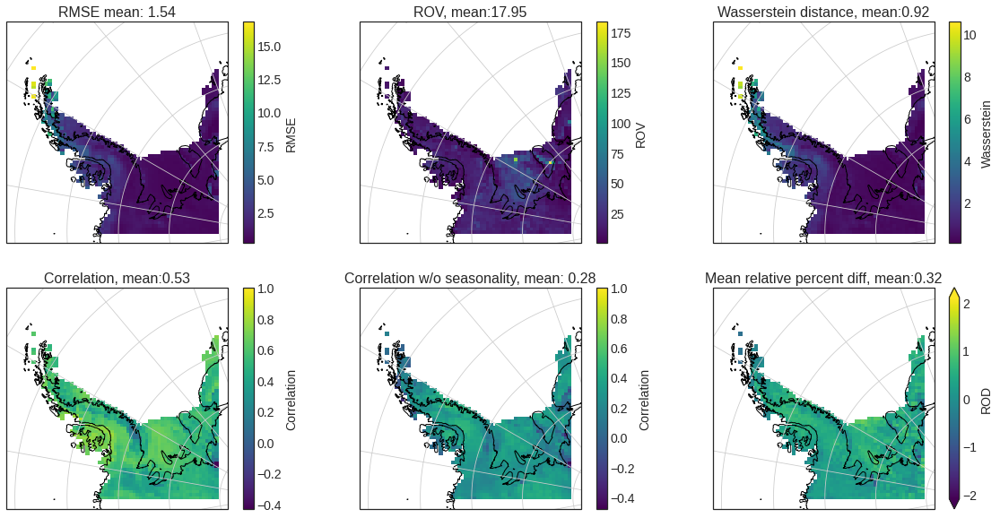

In [ ]:
ignoreSea = True
PearsonCorr, Wasserstein, ROV, MSE, RMSE, NRMSE, PearsonCorrAn, ROD = calculateMetrics(
    preds_Larsen_NRMSE_GCM,
    true_smb_Larsen_NRMSE_GCM,
    target_dataset,
    train_set,
    REGION,
    ignoreSea,
)
plotMetrics(
    PearsonCorr,
    Wasserstein,
    ROV,
    RMSE,
    PearsonCorrAn,
    ROD,
    target_dataset,
    REGION,
    today,
    trainingParam["num_epochs"],
    trainingParam["batch_size"],
    cmap = 'viridis', 
    figsize = (20, 10)
)

# Larsen - Baseline - MSE:

In [ ]:
mask = createMask(full_target[0,:,:], onechannel = True)
plt.imshow(mask)

Variables: ['EW', 'LWD', 'NW', 'PR', 'QQP', 'SP', 'SWD', 'TT']
Return input of GCMLike
Variables: ['EW', 'LWD', 'NW', 'PR', 'QQP', 'SP', 'SWD', 'TT']
Return input of GCMLike
Shapes of targets and inputs:
---------------------------
Target: (1452, 64, 64, 1)
Input 2D: (1452, 32, 32, 8)
Input 1D: (1452, 1, 1, 18)


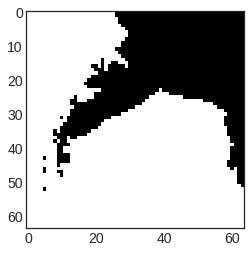

In [ ]:
REGION = "Larsen"
LOSS_ = "MSE"
TYPENET = "Baseline"
# Make target
targets, target_times = target_maker(target_dataset, region=REGION, resize=False)
# Full target to model
full_target = np.concatenate(targets, axis=0)
target_time = np.concatenate(target_times, axis=0)
target_lon = target_dataset["x"]
target_lat = target_dataset["y"]

i1D, i2D, i1D_ns, i2D_ns, VAR_LIST = make_inputs(
    GCMLike = GCMLike, GCM = None, size_input_domain=SIZE_INPUT_DOMAIN, Region=REGION,
    dropvarGCM = None, dropvarRCM = ['RF', 'SF', 'TTP']
)
full_input = [np.concatenate([i2D], axis=0), np.concatenate([i1D], axis=0)]

full_input_ns = [
    np.concatenate([i2D_ns], axis=0),
    np.concatenate([i1D_ns], axis=0),
]

REGIONS = [REGION]

mask = createMask(full_target[0,:,:], onechannel = True)
plt.imshow(mask)

print("Shapes of targets and inputs:\n---------------------------")
print("Target:", full_target.shape)
print("Input 2D:", full_input[0].shape)
print("Input 1D:", full_input[1].shape)

In [ ]:
# Parameters used in training
TYPENET = "Baseline"

trainingParam = dict(
    num_epochs=NUM_EPOCHS,
    batch_size=BATCH_SIZE,
    lr=LR,
    seed=SEED,
    amp=AMP,
    test_percent=TEST_PERCENT,
    val_percent=VAL_PERCENT,
    loss_=LOSS_,
    typeNet=TYPENET,
)
# Load datasets and U-Net
train_set, test_set, net = trainFlow(
    full_input,
    full_target,
    mask,
    region=REGION,
    train=False,
    randomSplit=False,
    **trainingParam,
)

# Load saved model
today = str(date.today())
# today = '2022-05-13'

model = f"MODEL_{today}_{REGION}_{NUM_EPOCHS}_{BATCH_SIZE}_{TYPENET}_{LOSS_}.pth"
downloadModel = True
if downloadModel:
    # downloadFileFromGC(pathModel, "", model)
    # Download from google drive
    idModel = '1wOAI86O7KiklKhnM7PLwT5tdqpx8bhuP'
    downloaded = Googledrive.CreateFile({"id": idModel})
    downloaded.GetContentFile(model)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# make predictions
(preds_Larsen_MSE,
    x_Larsen_MSE,
    z_Larsen_MSE,
    true_smb_Larsen_MSE,
    r_Larsen_MSE,
) = predict(net, device, test_set, model)

INFO: Using device cpu
INFO: Baseline model
INFO: Network:
	8 input channels X
	18 input channels Z
	Transposed conv upscaling
INFO: Test set size: 240
Train set size: 1212



X shape: torch.Size([1452, 8, 32, 32])


INFO: Loading saved model MODEL_2022-06-09_Larsen_100_32_Baseline_MSE.pth
INFO: Using device cpu
INFO: Saved model loaded!


#### Points and timeseries:

03/1992


/usr/local/lib/python3.7/dist-packages/cartopy/crs.py:228: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  if len(multi_line_string) > 1:
/usr/local/lib/python3.7/dist-packages/cartopy/crs.py:280: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  for line in multi_line_string:
/usr/local/lib/python3.7/dist-packages/cartopy/crs.py:347: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  if len(p_mline) > 0:


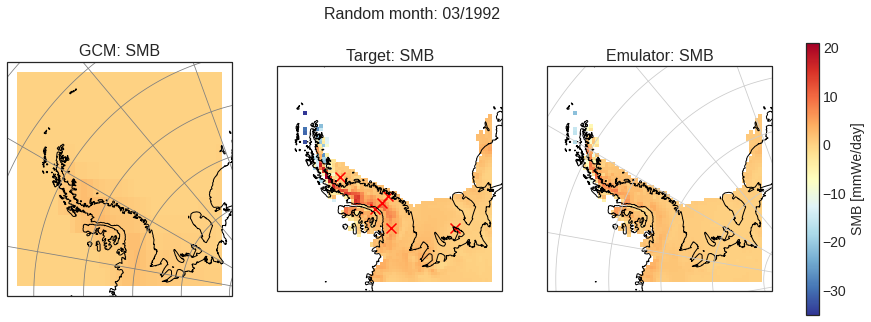

In [ ]:
points_RCM = (
    {"x": 16, "y": 32},
    {"x": 27, "y": 22},
    {"x": 29, "y": 24},
    {"x": 31, "y": 26},
    {"x": 32, "y": 16},
    {"x": 52, "y": 16},
)

time = plotRandomPrediction(
    preds_Larsen_MSE,
    x_Larsen_MSE,
    z_Larsen_MSE,
    true_smb_Larsen_MSE,
    r_Larsen_MSE,
    GCMLike,
    VAR_LIST,
    target_dataset,
    points_RCM,
    regions=[REGION],
    figsize = (15, 5)
)
print(time)

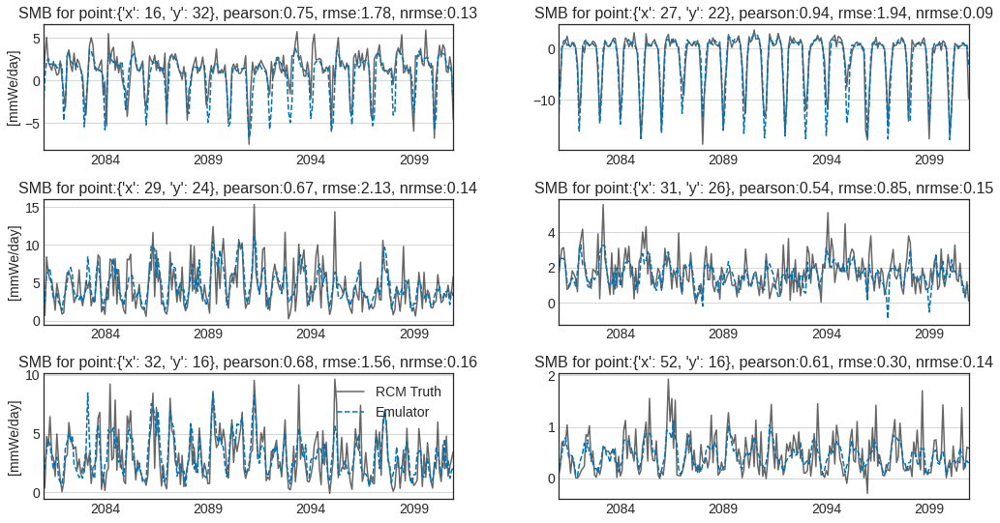

In [ ]:
plotTimeseries(
    preds_Larsen_MSE,
    true_smb_Larsen_MSE,
    train_set,
    target_dataset,
    points_RCM,
    REGION,
    len(points_RCM),
    rollingMean = None
)

### Annual SMB predictions:

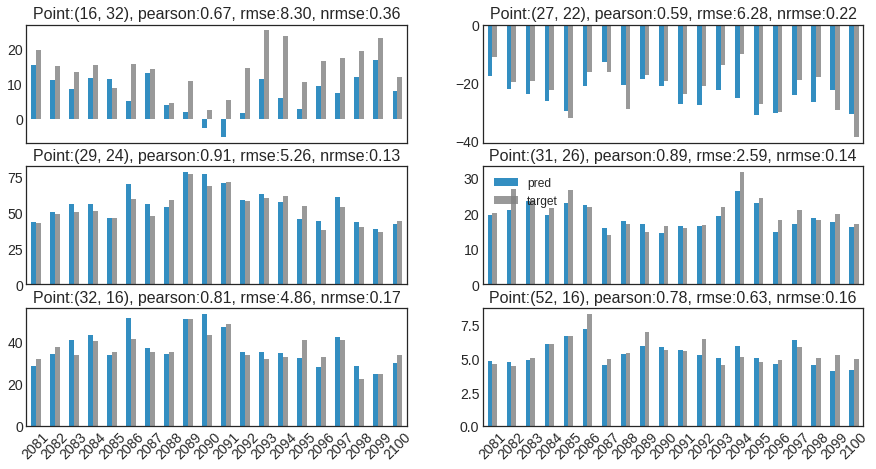

In [ ]:
annualSMB(preds_Larsen_MSE[:], true_smb_Larsen_MSE, train_set, target_dataset, points_RCM)

### Metrics:

/usr/local/lib/python3.7/dist-packages/numpy/lib/function_base.py:2691: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.7/dist-packages/numpy/lib/function_base.py:2692: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]
/content/metrics.py:39: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  predictions = torch.tensor(preds).clone().detach()
/content/metrics.py:40: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  target = torch.tensor(true_smb).clone().detach()
/usr/local/lib/python3.7/dist-packages/numpy/lib/function_base.py:2691: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]


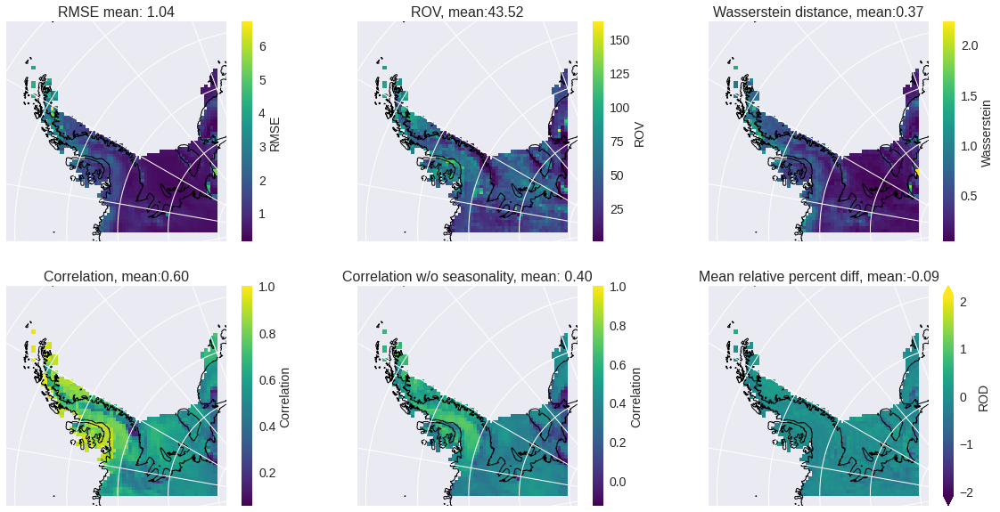

In [ ]:
ignoreSea = True
PearsonCorr, Wasserstein, ROV, MSE, RMSE, NRMSE, PearsonCorrAn, ROD = calculateMetrics(
    preds_Larsen_MSE,
    true_smb_Larsen_MSE,
    target_dataset,
    train_set,
    REGION,
    ignoreSea,
)
plotMetrics(
    PearsonCorr,
    Wasserstein,
    ROV,
    RMSE,
    PearsonCorrAn,
    ROD,
    target_dataset,
    REGION,
    today,
    trainingParam["num_epochs"],
    trainingParam["batch_size"],
    cmap = 'viridis', 
    figsize = (20, 10)
)

### Predictions:

/usr/local/lib/python3.7/dist-packages/cartopy/crs.py:228: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  if len(multi_line_string) > 1:
/usr/local/lib/python3.7/dist-packages/cartopy/crs.py:280: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  for line in multi_line_string:
/usr/local/lib/python3.7/dist-packages/cartopy/crs.py:347: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  if len(p_mline) > 0:


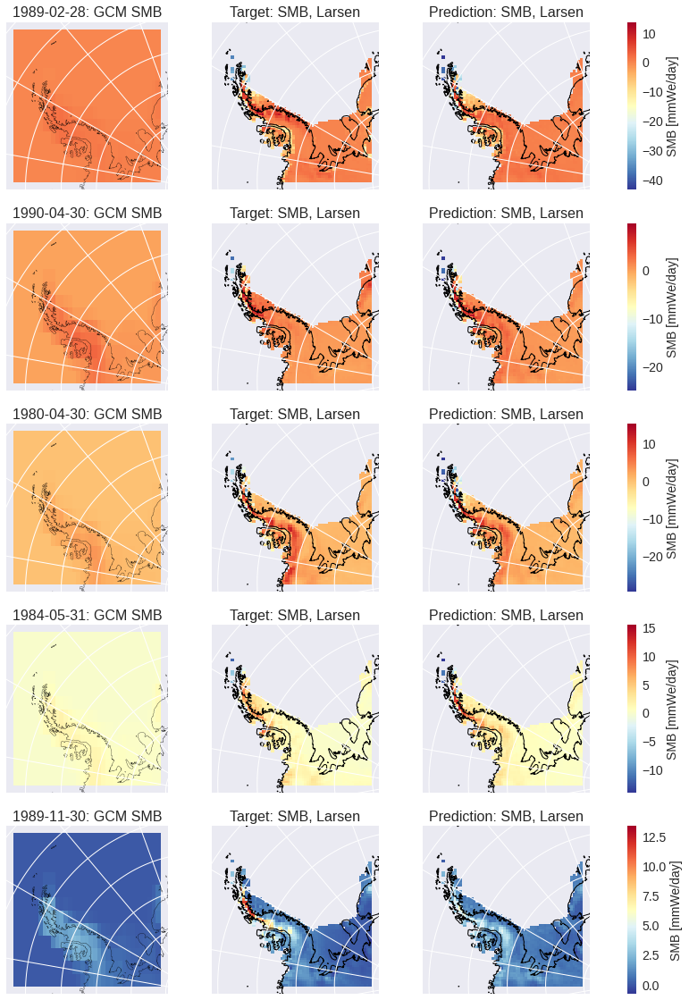

In [ ]:
plotMultiplePredictions(
    preds_Larsen_MSE,
    x_Larsen_MSE,
    z_Larsen_MSE,
    true_smb_Larsen_MSE,
    r_Larsen_MSE,
    GCMLike,
    VAR_LIST,
    target_dataset,
    points_RCM,
    regions=[REGION],
    figsize = (15, 20), N = 5)

### Ridge:

Text(0.5, 0.98, '')

/usr/local/lib/python3.7/dist-packages/cartopy/crs.py:228: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  if len(multi_line_string) > 1:
/usr/local/lib/python3.7/dist-packages/cartopy/crs.py:280: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  for line in multi_line_string:
/usr/local/lib/python3.7/dist-packages/cartopy/crs.py:347: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  if len(p_mline) > 0:


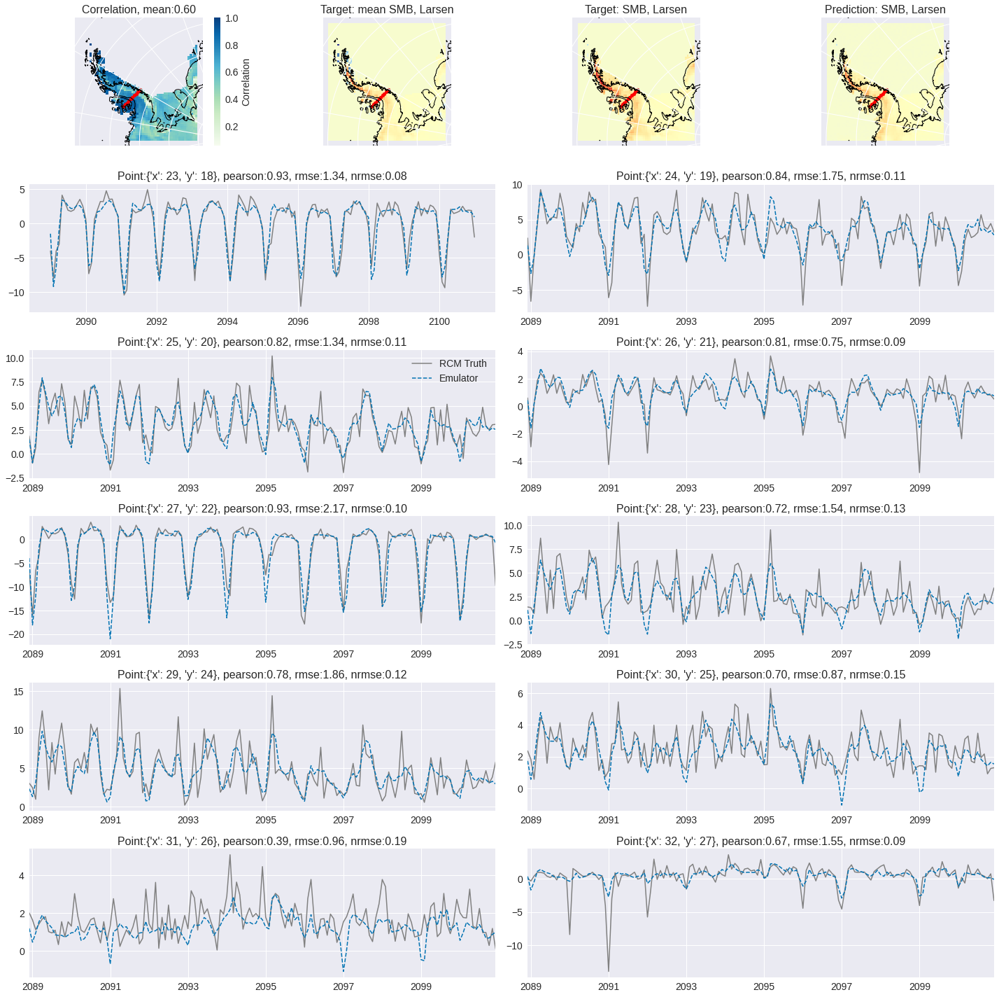

In [ ]:
from metrics import *
# plot points
coordinates = (
    {"x": 23, "y": 18},
    {"x": 24, "y": 19},
    {"x": 25, "y": 20},
    {"x": 26, "y": 21},
    {"x": 27, "y": 22},
    {"x": 28, "y": 23},
    {"x": 29, "y": 24},
    {"x": 30, "y": 25},
    {"x": 31, "y": 26},
    {"x": 32, "y": 27}
)

plotRidge(
    coordinates,
    PearsonCorr,
    true_smb_Larsen_MSE,
    preds_Larsen_MSE,
    target_dataset,
    GCMLike,
    train_set,
    REGION,
    N = len(coordinates),
    marker = '.',
    figsize = (20, 20),
)
nameFig = "{}_ts_{}_{}_{}_{}.png".format(
    today, REGION, LOSS_, trainingParam["num_epochs"], trainingParam["batch_size"]
)
plt.suptitle('')


## Compare models:

/usr/local/lib/python3.7/dist-packages/cartopy/crs.py:228: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  if len(multi_line_string) > 1:
/usr/local/lib/python3.7/dist-packages/cartopy/crs.py:280: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  for line in multi_line_string:
/usr/local/lib/python3.7/dist-packages/cartopy/crs.py:347: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  if len(p_mline) > 0:


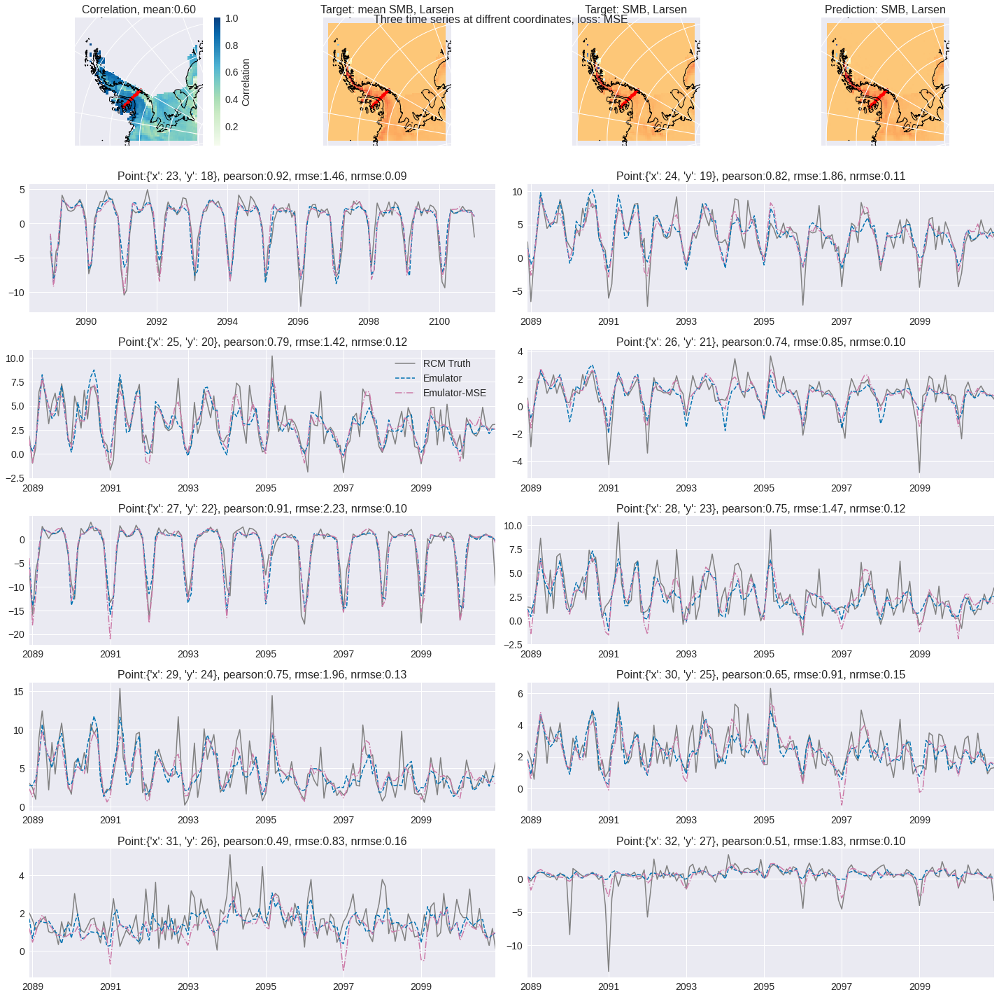

In [ ]:
from metrics import *
# plot points
coordinates = (
    {"x": 23, "y": 18},
    {"x": 24, "y": 19},
    {"x": 25, "y": 20},
    {"x": 26, "y": 21},
    {"x": 27, "y": 22},
    {"x": 28, "y": 23},
    {"x": 29, "y": 24},
    {"x": 30, "y": 25},
    {"x": 31, "y": 26},
    {"x": 32, "y": 27}
)

plotRidge(
    coordinates,
    PearsonCorr,
    true_smb_Larsen_NRMSE,
    preds_Larsen_NRMSE,
    target_dataset,
    GCMLike,
    train_set,
    REGION,
    N = len(coordinates),
    marker = '.',
    figsize = (20, 20),
    preds_Larsen_2 = preds_Larsen_MSE
)
nameFig = "{}_ts_{}_{}_{}_{}.png".format(
    today, REGION, LOSS_, trainingParam["num_epochs"], trainingParam["batch_size"]
)
plt.suptitle('Three time series at diffrent coordinates, loss: MSE')
plt.savefig(nameFig)

In [ ]:
PearsonCorr_MSE, Wasserstein_MSE, ROV_MSE, MSE_MSE, RMSE_MSE, NRMSE_MSE, PearsonCorrAn_MSE, ROD_MSE = calculateMetrics(
    preds_Larsen_MSE,
    true_smb_Larsen_MSE,
    target_dataset,
    train_set,
    REGION,
    ignoreSea,
)

PearsonCorr_NRMSE, Wasserstein_NRMSE, ROV_NRMSE, MSE_NRMSE, RMSE_NRMSE, NRMSE_NRMSE, PearsonCorrAn_NRMSE, ROD_NRMSE = calculateMetrics(
    preds_Larsen_NRMSE,
    true_smb_Larsen_NRMSE,
    target_dataset,
    train_set,
    REGION,
    ignoreSea,
)


/usr/local/lib/python3.7/dist-packages/numpy/lib/function_base.py:2691: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.7/dist-packages/numpy/lib/function_base.py:2692: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]
/content/metrics.py:39: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  predictions = torch.tensor(preds).clone().detach()
/content/metrics.py:40: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  target = torch.tensor(true_smb).clone().detach()
/usr/local/lib/python3.7/dist-packages/numpy/lib/function_base.py:2691: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]


/usr/local/lib/python3.7/dist-packages/cartopy/crs.py:228: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  if len(multi_line_string) > 1:
/usr/local/lib/python3.7/dist-packages/cartopy/crs.py:280: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  for line in multi_line_string:
/usr/local/lib/python3.7/dist-packages/cartopy/crs.py:347: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  if len(p_mline) > 0:


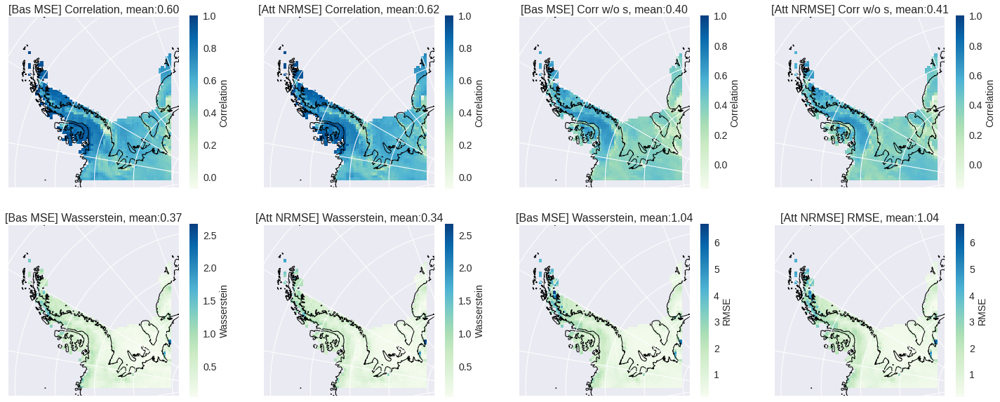

In [ ]:
from metrics import *
ComparMetrics(
    [PearsonCorr_MSE, PearsonCorr_NRMSE],
    [Wasserstein_MSE, Wasserstein_NRMSE],
    [RMSE_MSE, RMSE_NRMSE],
    [PearsonCorrAn_MSE, PearsonCorrAn_NRMSE], 
    target_dataset,
    region = 'Larsen', models = ['Bas MSE', 'Att NRMSE'], figsize = (25, 10))

## Evaluation table:

In [ ]:
PearsonCorr_NRMSE, Wasserstein_NRMSE, ROV_NRMSE, MSE_NRMSE, RMSE_NRMSE, NRMSE_NRMSE, PearsonCorrAn_NRMSE, ROD_NRMSE = calculateMetrics(
    preds_Larsen_NRMSE,
    true_smb_Larsen_NRMSE,
    target_dataset,
    train_set,
    REGION,
    ignoreSea,
)

PearsonCorr_MSE, Wasserstein_MSE, ROV_MSE, MSE_MSE, RMSE_MSE, NRMSE_MSE, PearsonCorrAn_MSE, ROD_MSE = calculateMetrics(
    preds_Larsen_MSE,
    true_smb_Larsen_MSE,
    target_dataset,
    train_set,
    REGION,
    ignoreSea,
)

/usr/local/lib/python3.7/dist-packages/numpy/lib/function_base.py:2691: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.7/dist-packages/numpy/lib/function_base.py:2692: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]
/content/metrics.py:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  predictions = torch.tensor(preds).clone().detach()
/content/metrics.py:33: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  target = torch.tensor(true_smb).clone().detach()
/usr/local/lib/python3.7/dist-packages/numpy/lib/function_base.py:2691: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]


In [ ]:
l = [
    metricsData(Wasserstein_MSE),
     metricsData(MSE_MSE),
     metricsData(RMSE_MSE),
    metricsData(NRMSE_MSE),
    metricsData(ROV_MSE),
    metricsData(PearsonCorr_MSE),
     metricsData(PearsonCorrAn_MSE),
     metricsData(ROD_MSE)
]

df_MSE = pd.DataFrame(l, index=["Wasserstein", "MSE","RMSE", "NRMSE", "ROV", "Pearson", "Pearson_An", "ROD"])
df_MSE["Loss"] = ["MSE" for i in range(len(df_MSE))]
df_MSE = df_MSE.reset_index()

In [ ]:
l = [
    metricsData(Wasserstein_NRMSE),
     metricsData(MSE_NRMSE),
     metricsData(RMSE_NRMSE),
    metricsData(NRMSE_NRMSE),
    metricsData(ROV_NRMSE),
    metricsData(PearsonCorr_NRMSE),
     metricsData(PearsonCorrAn_NRMSE),
     metricsData(ROD_NRMSE)
]

df_NRMSE = pd.DataFrame(l, index=["Wasserstein", "MSE","RMSE", "NRMSE", "ROV", "Pearson", "Pearson_An", "ROD"])
df_NRMSE["Loss"] = ["NRMSE" for i in range(len(df_NRMSE))]
df_NRMSE = df_NRMSE.reset_index()

In [ ]:
pd.concat([df_NRMSE, df_MSE]).groupby(['Loss', 'index']).mean()

min       p05       mean     median        p95  \
Loss  index                                                              
MSE   MSE          0.020082  0.108161   1.835828   0.494633   7.300232   
      NRMSE        0.001892  0.004392   0.014036   0.009392   0.036079   
      Pearson      0.039573  0.340815   0.588246   0.569131   0.906298   
      Pearson_An  -0.015339  0.163806   0.371141   0.337504   0.643688   
      RMSE         0.141713  0.328878   1.051083   0.703301   2.701876   
      ROD         -2.000000 -1.740527  -0.103178  -0.031586   1.064128   
      ROV          0.122703  7.410506  45.279063  41.650984  98.197501   
      Wasserstein  0.037153  0.081717   0.340841   0.266551   0.811833   
NRMSE MSE          0.018847  0.118507   1.891621   0.499946   7.487810   
      NRMSE        0.001833  0.004597   0.014331   0.009442   0.036540   
      Pearson      0.058810  0.339575   0.575619   0.545219   0.915615   
      Pearson_An  -0.056923  0.139976   0.356112   0.338013   0.625729   
      RMSE         0.137283  0.344249   1.073218   0.707068   2.736385   
      ROD         -2.000000 -1.631936   0.018404   0.043918   1.491683   
      ROV          0.014672  8.039506  48.720784  46.325547  95.967131   
      Wasserstein  0.037142  0.089294   0.379400   0.261532   1.060810   

                          max  
Loss  index                    
MSE   MSE           45.064953  
      NRMSE          0.089643  
      Pearson        0.971623  
      Pearson_An     0.723036  
      RMSE           6.713044  
      ROD            2.000000  
      ROV          151.549709  
      Wasserstein    2.080045  
NRMSE MSE           40.649338  
      NRMSE          0.085138  
      Pearson        0.974062  
      Pearson_An     0.772979  
      RMSE           6.375683  
      ROD            2.000000  
      ROV          162.514341  
      Wasserstein    2.728697

## Random plots:

#### Time series of GCM:

/usr/local/lib/python3.7/dist-packages/cartopy/crs.py:228: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  if len(multi_line_string) > 1:
/usr/local/lib/python3.7/dist-packages/cartopy/crs.py:280: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  for line in multi_line_string:
/usr/local/lib/python3.7/dist-packages/cartopy/crs.py:347: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  if len(p_mline) > 0:
/usr/local/lib/python3.7/dist-packages/cartopy/crs.py:385: ShapelyDeprecationWarning: Iteration over multi-pa

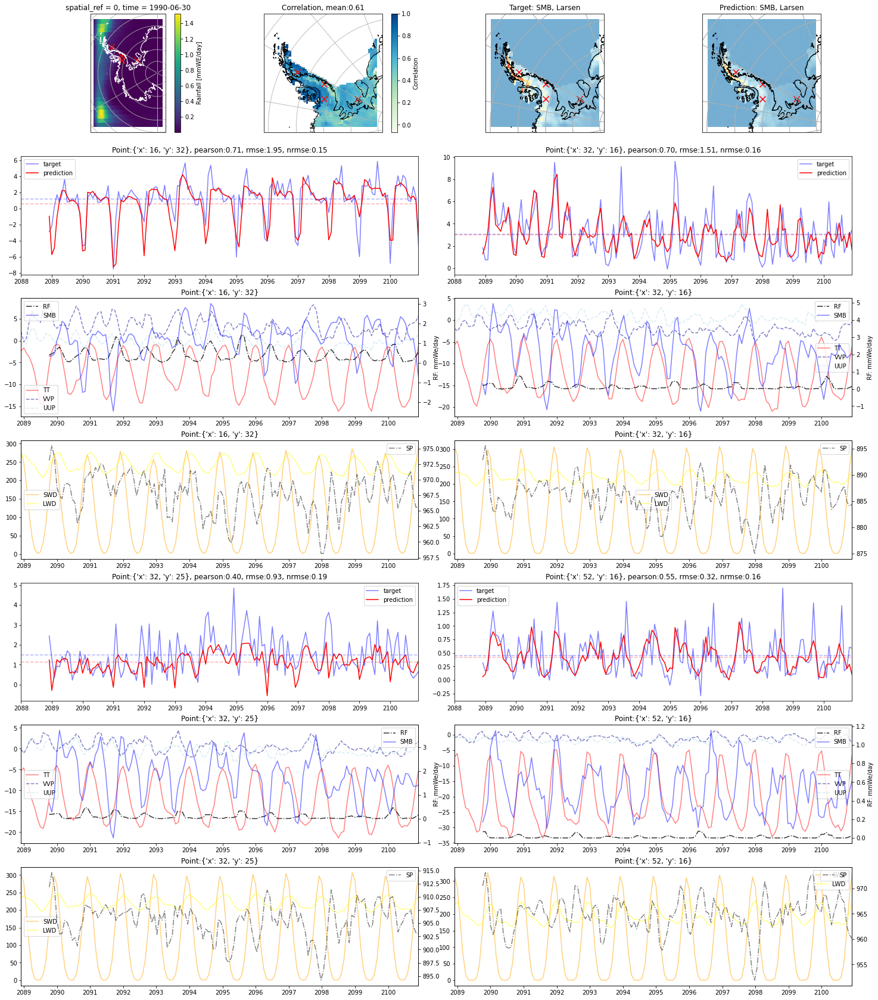

In [ ]:
from metrics import *

points_GCM = (
    {"x": 12, "y": 18},
    {"x": 19, "y": 15},
    {"x": 19, "y": 16},
    {"x": 30, "y": 15},
)
points_RCM = (
    {"x": 16, "y": 32},
    {"x": 32, "y": 16},
    {"x": 32, "y": 25},
    {"x": 52, "y": 16},
)
plotGCMTimeseries(
    true_smb_Larsen_NRMSE,
    preds_Larsen_NRMSE,
    GCMLike,
    PearsonCorr,
    target_dataset,
    train_set,
    points_GCM,
    points_RCM,
    REGION,
)

#### Hovmöller plot: 
space versus time, through mountain ridge of Larsen. x: distance, y: time and plot values

In [ ]:
 ax1 = plt.subplot(2,2,1, projection=ccrs.SouthPolarStereo())
ax2 = plt.subplot(2,2,2, projection=ccrs.SouthPolarStereo())

ds = createLowerTarget(target_dataset, region=REGION, Nx=64, Ny=64, print_=False)
    
meanPred = np.nanmean(np.array(preds_Larsen_NRMSE), axis = 0)
meanTarget = np.nanmean(np.array(true_smb_Larsen_NRMSE), axis = 0)

vmin = np.min([meanTarget, meanPred])
vmax = np.max([meanTarget, meanPred])
plotPred(target_dataset, meanPred, ax1, vmin, vmax, region=REGION)
plotTarget(target_dataset, meanTarget, ax2, vmin, vmax, region=REGION)

for ax in [ax1,ax2]:
        for p in coordinates:
            ax.scatter(
                ds.isel(x=p["x"]).x.values,
                ds.isel(y=p["y"]).y.values,
                marker=".",
                s=50,
                color="red",
            )
array = np.empty((len(coordinates),len(preds_Larsen_NRMSE)))
for i in range(len(coordinates)):
  p = coordinates[i]
  array[i,:] = np.array(preds_Larsen_NRMSE)[:, p["y"], p["x"], 0]

times = target_dataset.time.values[len(train_set) :]
x = [p['x'] for p in coordinates]

fig = plt.figure(figsize=(10, 20))

df = pd.DataFrame(index = times, data = array.transpose())
ax3 = plt.subplot(2,2,(3,4))
cf = ax3.contourf(x, times, array.transpose(), cmap='RdYlBu_r')
cs = ax3.contour(x, times, array.transpose(), colors='k', linewidths=1)
cbar = plt.colorbar(cf, orientation='horizontal', pad=0.04, aspect=50, extendrect=True)
cbar.set_label('SMB: mmWE/day')

# Make some ticks and tick labels
#ax.set_xticks([0, 90, 180, 270, 357.5])
ax.set_xticklabels('x coordinate')
ax3.set_yticks(times[4::8])
ax3.set_yticklabels(times[4::8])

#cf = ax2.contourf(lons, vtimes, mpcalc.smooth_n_point(avg_data, 9, 2), clevs, cmap=plt.cm.bwr, extend='both')